# House Price Predictions

First import packages and datasets. Do data pre-processing and than data visualization for understanding our dataset. Next step is model building but before model building we have to do feature selections for our model's better performance and lastly make Prediction on our test data.

Import the packages & datasets

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns 
%matplotlib inline

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

Check head foe both dataset

In [3]:
train = pd.read_csv('HPP_train.csv')
test = pd.read_csv('HPP_test.csv')
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [5]:
print({"train_shape": train.shape, "test_shape": test.shape})

{'train_shape': (1460, 81), 'test_shape': (1459, 80)}


## Lets focus on train dataset

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [7]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


In [8]:
train.isna().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

In [9]:
train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

### if na value is less than 5% its safe to drop them if its not replace them and if na values ig 80% or greater that drop the column

In [10]:
for col in train.columns:
    na_count = train[col].isna().sum()
    percentage_na = (na_count / 1460) * 100
    data_type = train[col].dtype

    if data_type == 'int64' or data_type == 'float64':
        mean_value = train[col].mean()
        median_value = train[col].median()
        print(f"Column Name: {col}")
        print(f"Total NA Values: {na_count}")
        print(f"Percentage NA Values: {percentage_na:.2f}%")
        print(f"Data Type: {data_type}")
        print(f"Mean Value: {mean_value:.2f}")
        print(f"Median Value: {median_value:.2f}")
        print()
    elif data_type == 'object':
        mode_value = train[col].mode().values[0]
        print(f"Column Name: {col}")
        print(f"Total NA Values: {na_count}")
        print(f"Percentage NA Values: {percentage_na:.2f}%")
        print(f"Data Type: {data_type}")
        print(f"Mode Value: {mode_value}")
        print()

Column Name: Id
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: int64
Mean Value: 730.50
Median Value: 730.50

Column Name: MSSubClass
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: int64
Mean Value: 56.90
Median Value: 50.00

Column Name: MSZoning
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: object
Mode Value: RL

Column Name: LotFrontage
Total NA Values: 259
Percentage NA Values: 17.74%
Data Type: float64
Mean Value: 70.05
Median Value: 69.00

Column Name: LotArea
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: int64
Mean Value: 10516.83
Median Value: 9478.50

Column Name: Street
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: object
Mode Value: Pave

Column Name: Alley
Total NA Values: 1369
Percentage NA Values: 93.77%
Data Type: object
Mode Value: Grvl

Column Name: LotShape
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: object
Mode Value: Reg

Column Name: LandContour
Total NA Values: 0
Percentage NA Values: 0.00%
Da

In [11]:
train1 = train
train1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


here we are filling the NA value for numerical variables using median and categorical variables using model and if the variable have 80% or more missing value we will drop those variables

In [12]:
for col in train1.columns:
    na_count = train1[col].isna().sum()
    percentage_na = (na_count / 1460) * 100
    data_type = train1[col].dtype

    if percentage_na >= 80:
        # Drop the column if more than 80% of the values are missing
        train1.drop(col, axis=1, inplace=True)
        print(f"Column '{col}' has {percentage_na:.2f}% NA values and is dropped.\n")
    elif na_count == 0:
        # If there are no NA values, print that we don't need to fill this column
        print(f"Column '{col}' has no NA values. No filling required.\n")
    else:
        if data_type == 'int64' or data_type == 'float64':
            # Fill NA values with median for numeric columns
            median_value = train1[col].median()
            train1[col].fillna(median_value, inplace=True)
            print(f"Column '{col}' (dtype: {data_type}) NA values filled with median value: {median_value:.2f}")
        elif data_type == 'object':
            # Fill NA values with mode for object columns
            mode_value = train1[col].mode().values[0]
            train1[col].fillna(mode_value, inplace=True)
            print(f"\nColumn '{col}' (dtype: {data_type}) NA values filled with mode value: {mode_value}")

Column 'Id' has no NA values. No filling required.

Column 'MSSubClass' has no NA values. No filling required.

Column 'MSZoning' has no NA values. No filling required.

Column 'LotFrontage' (dtype: float64) NA values filled with median value: 69.00
Column 'LotArea' has no NA values. No filling required.

Column 'Street' has no NA values. No filling required.

Column 'Alley' has 93.77% NA values and is dropped.

Column 'LotShape' has no NA values. No filling required.

Column 'LandContour' has no NA values. No filling required.

Column 'Utilities' has no NA values. No filling required.

Column 'LotConfig' has no NA values. No filling required.

Column 'LandSlope' has no NA values. No filling required.

Column 'Neighborhood' has no NA values. No filling required.

Column 'Condition1' has no NA values. No filling required.

Column 'Condition2' has no NA values. No filling required.

Column 'BldgType' has no NA values. No filling required.

Column 'HouseStyle' has no NA values. No filling

In [13]:
train1.isna().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 77, dtype: int64

## Data Visualization

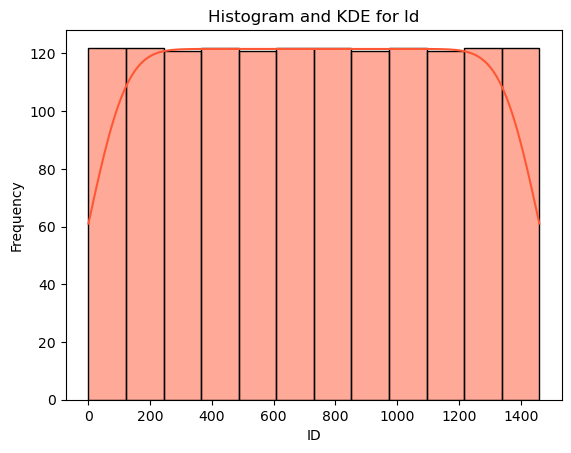

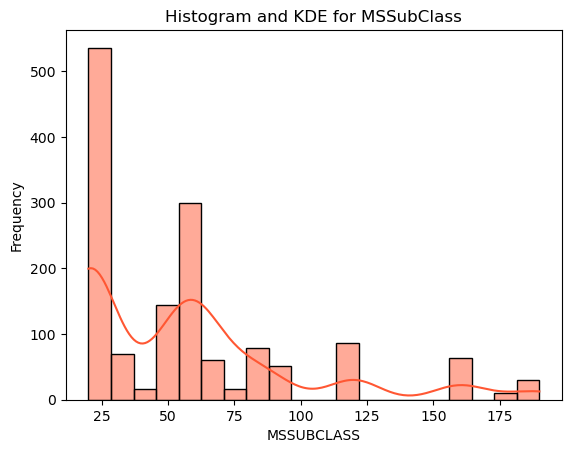

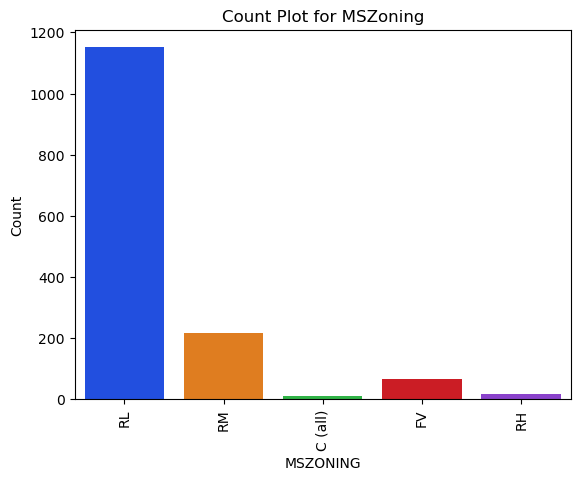

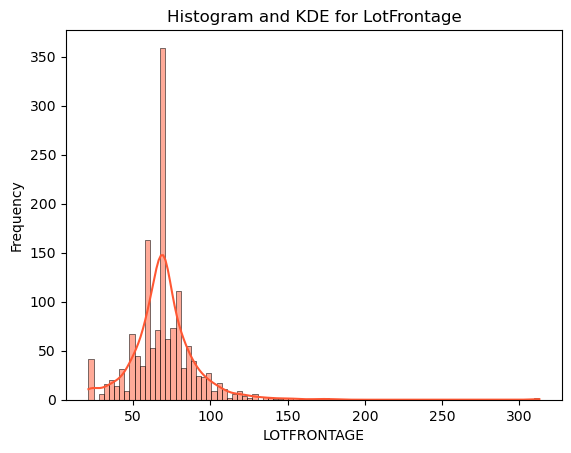

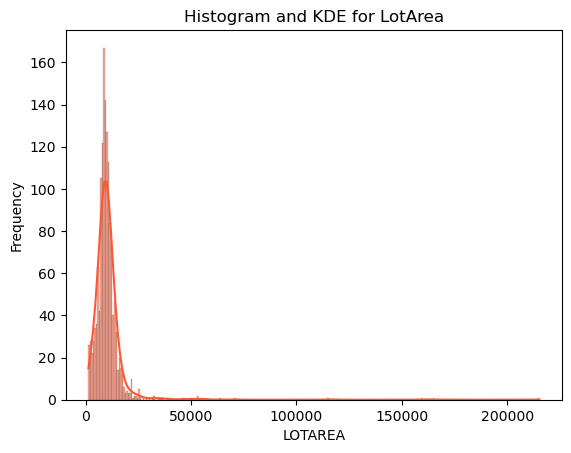

...

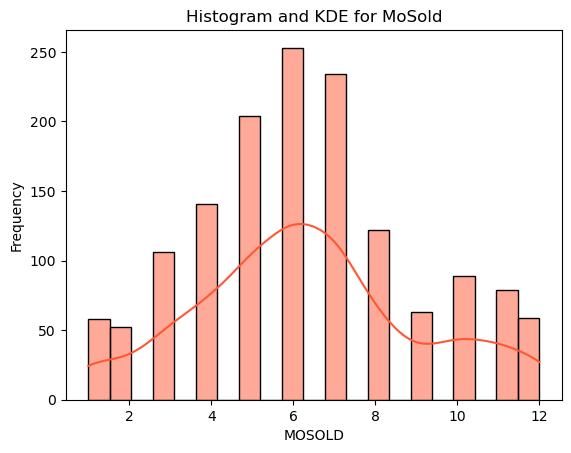

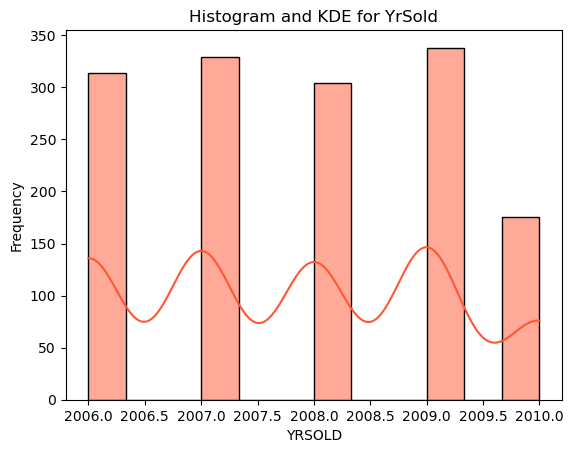

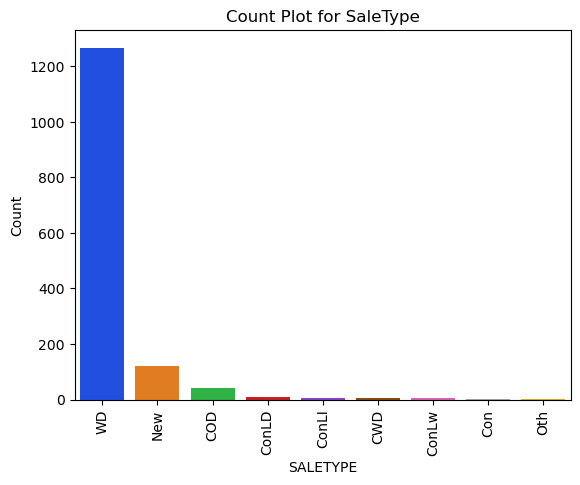

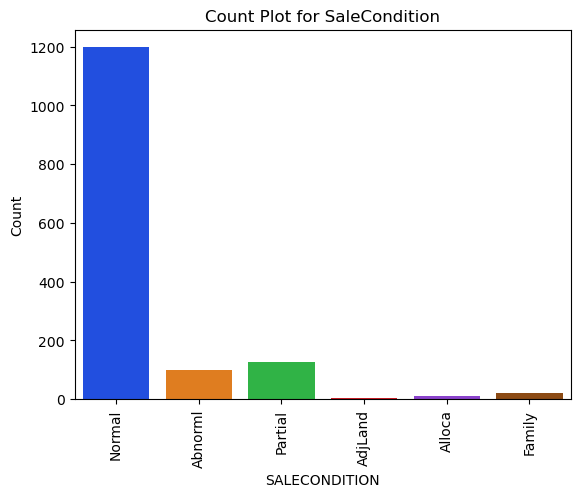

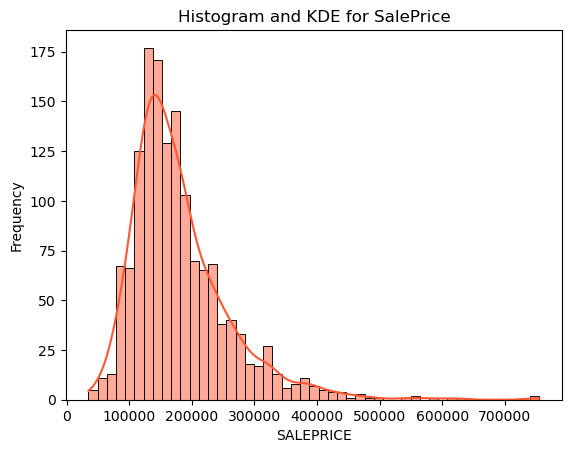

In [14]:
pal1 = "#FF5733"
pal2 = "bright"
for col in train1.columns:
    
    data_type = train1[col].dtype

    if data_type == 'int64' or data_type == 'float64':
        # Histogram and KDE for numeric columns
        sns.histplot(data=train1, x=col, kde=True, color=pal1)
        plt.title(f'Histogram and KDE for {col}')
        plt.xlabel(col.upper())
        plt.ylabel('Frequency')
        plt.show()
    elif data_type == 'object':
        sns.countplot(data=train1, x=col, palette=pal2)
        plt.title(f'Count Plot for {col}')
        plt.xlabel(col.upper())
        plt.ylabel('Count')
        plt.xticks(rotation=90)
        plt.show()

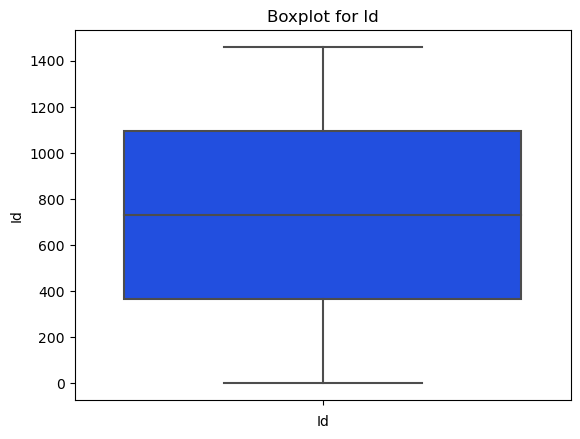

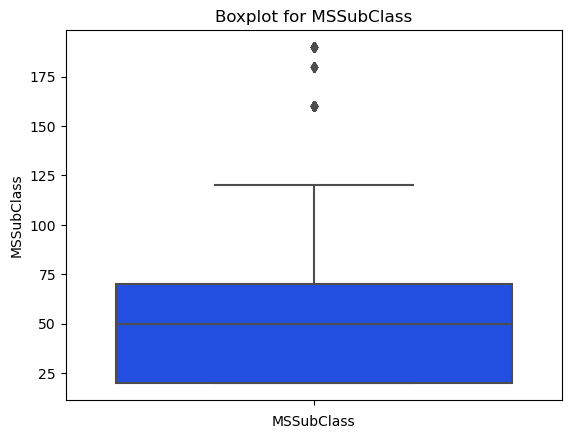

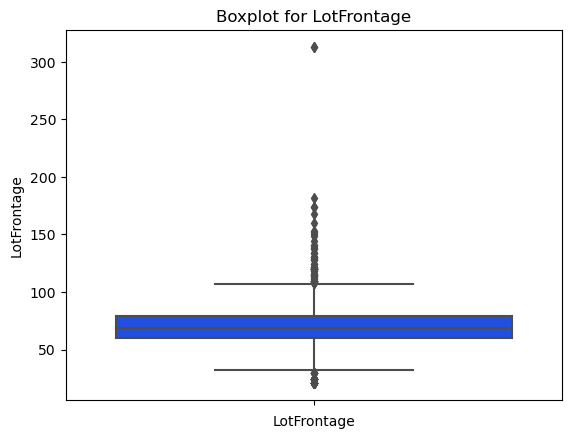

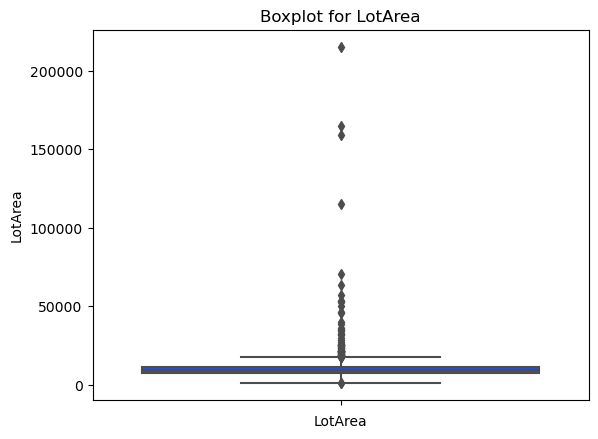

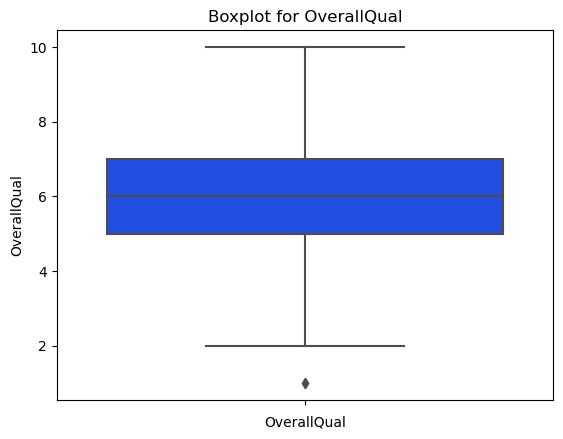

...

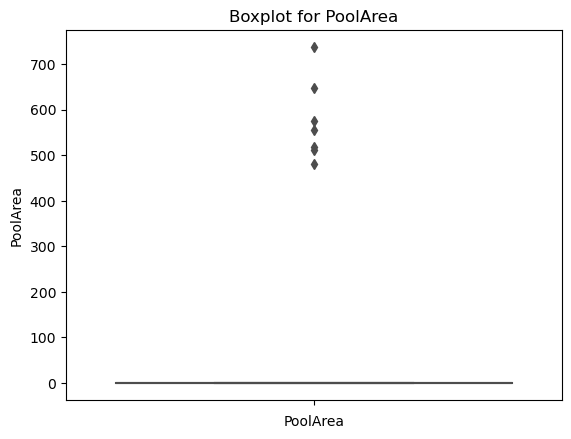

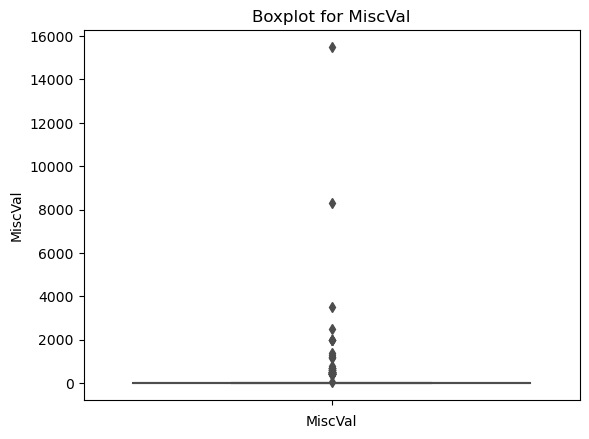

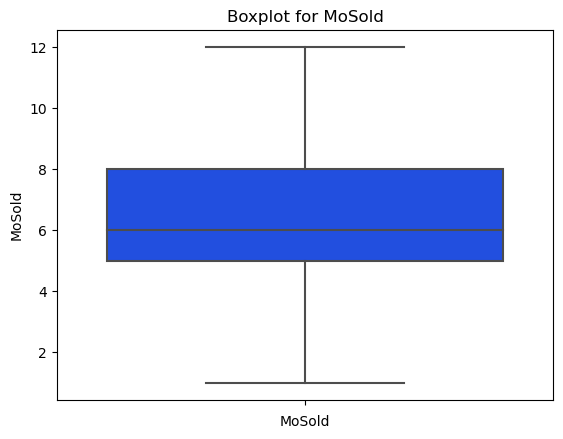

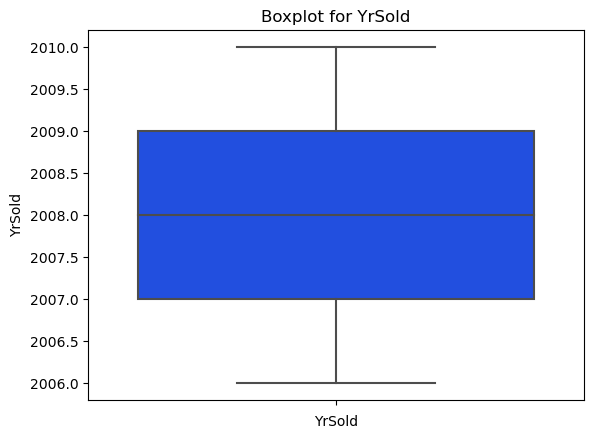

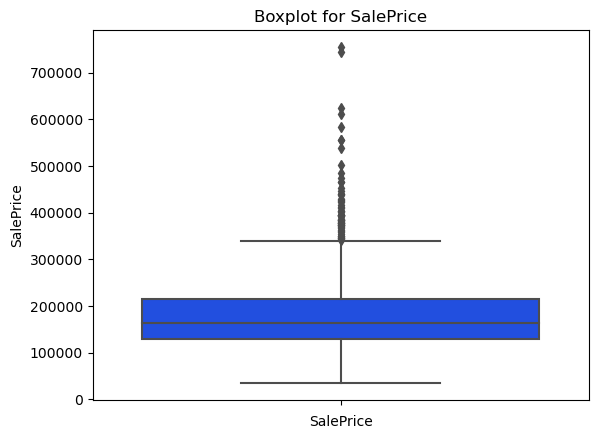

In [15]:
for col in train1.columns:
    data_type = train1[col].dtype

    if data_type == 'int64' or data_type == 'float64':
        # Boxplot for numeric columns with values
        sns.boxplot(data=train, y=col, palette = "bright")
        plt.title(f'Boxplot for {col}')
        plt.xlabel(col)
        #plt.ylabel('Value')
        plt.show()

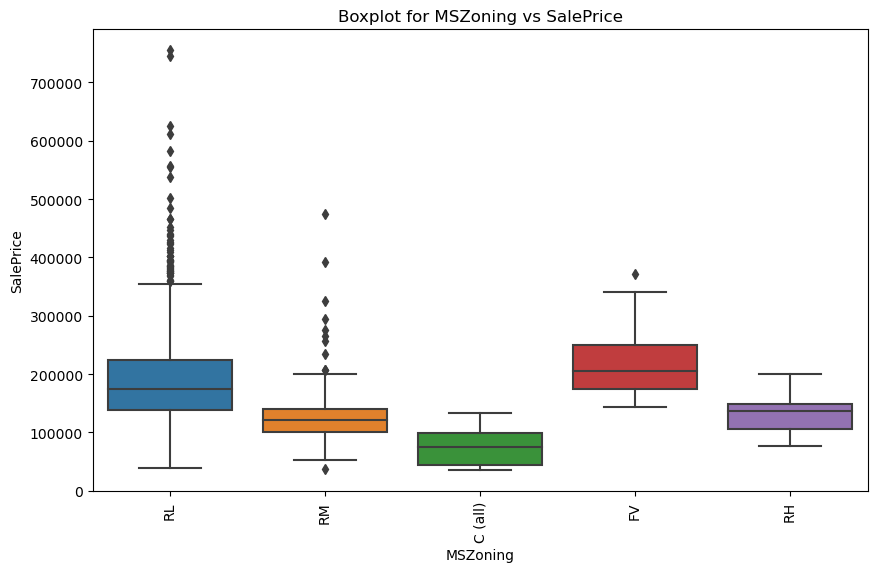

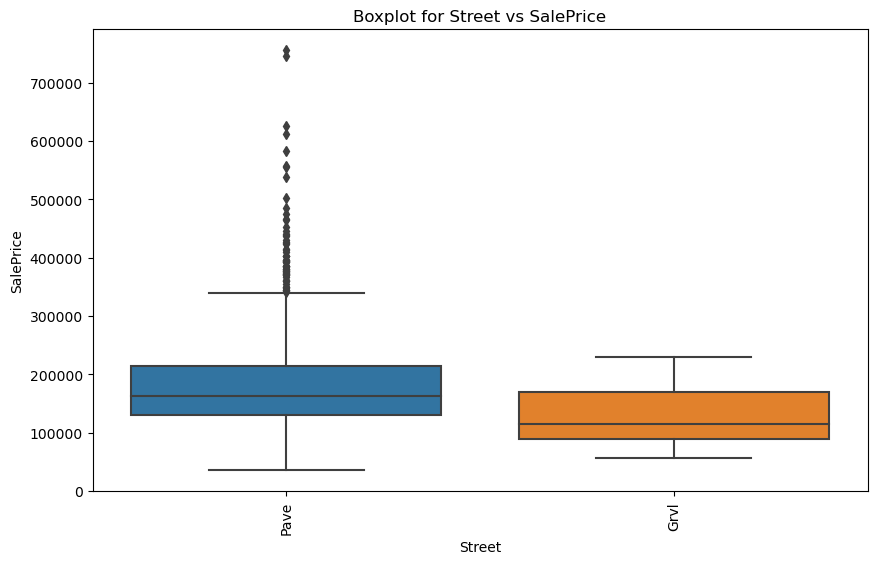

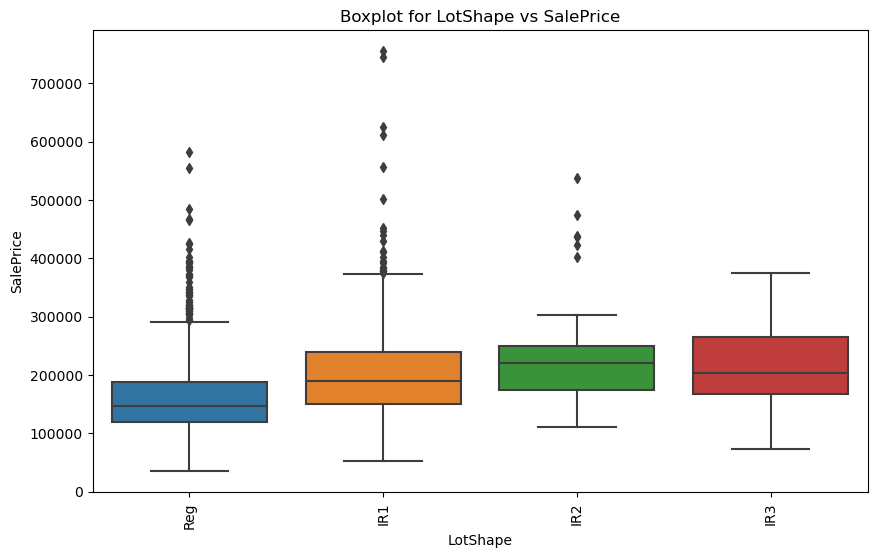

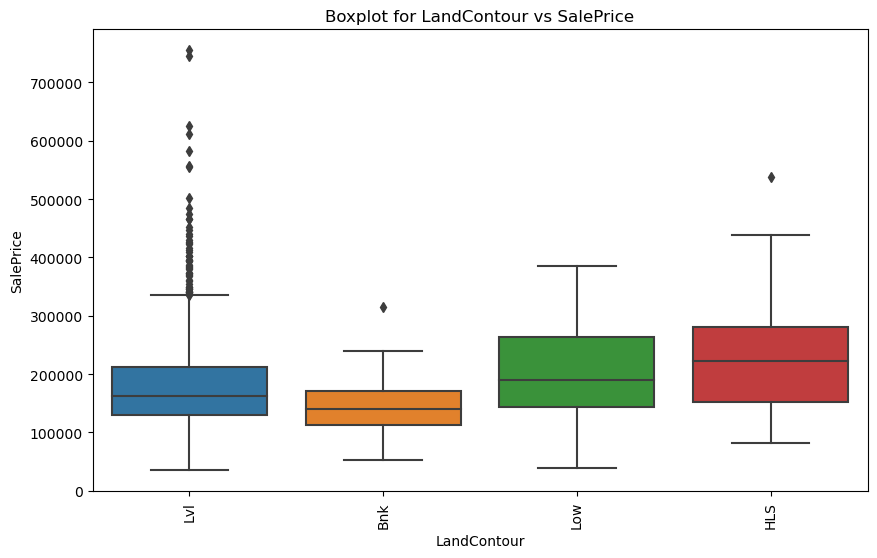

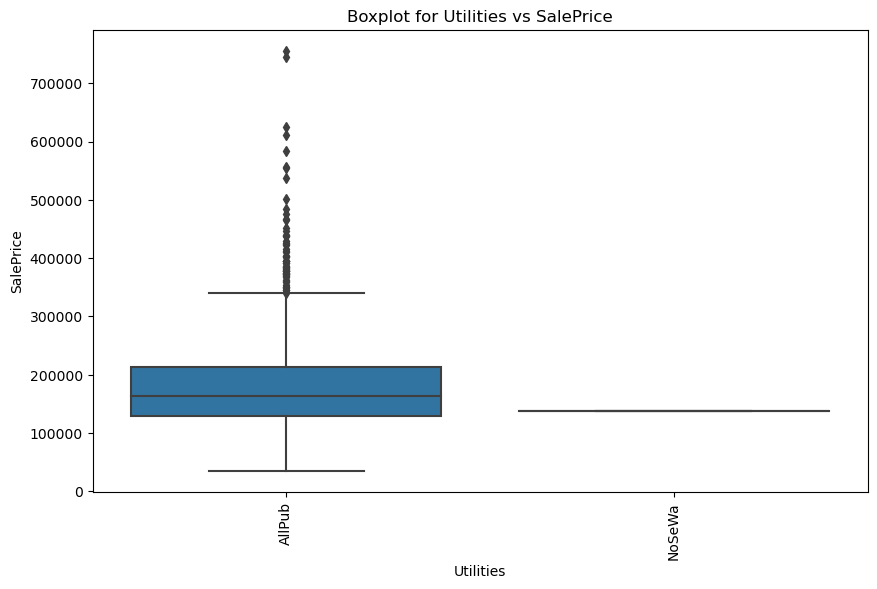

...

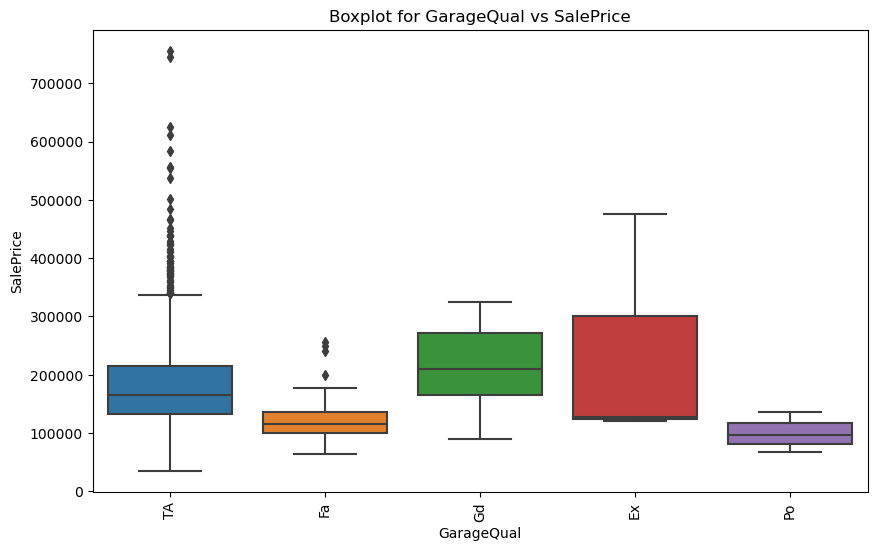

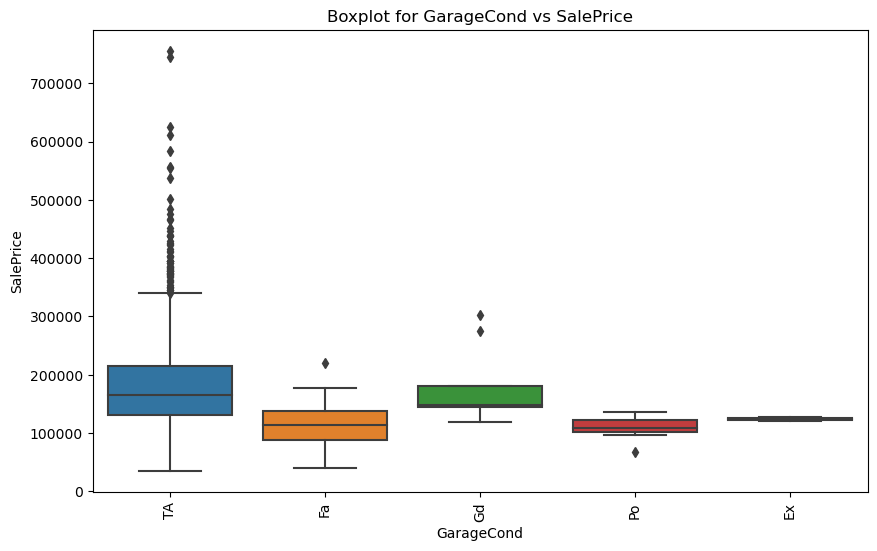

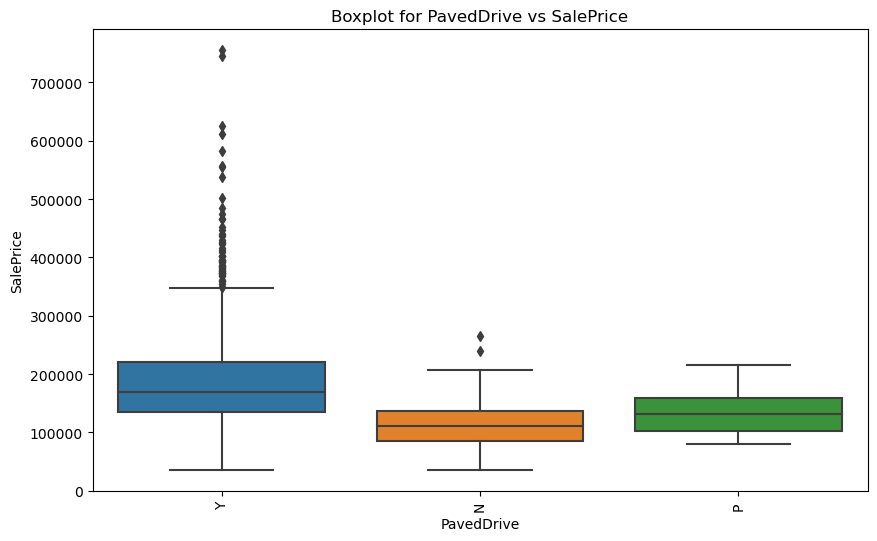

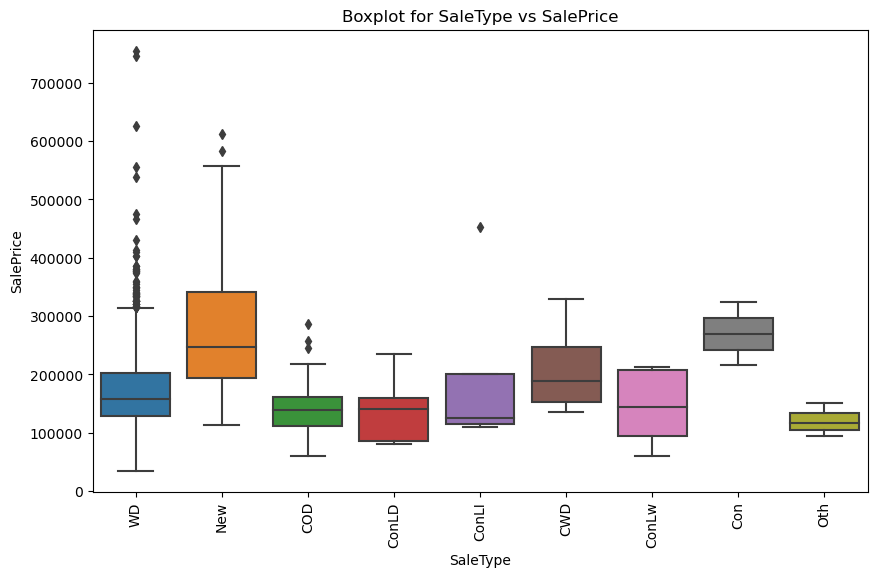

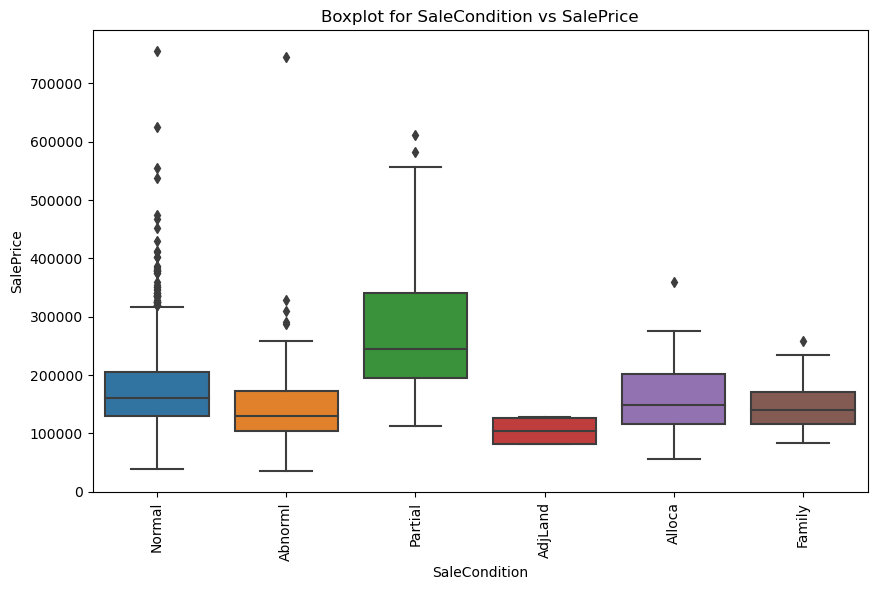

In [16]:
categorical_columns = train1.select_dtypes(include='object').columns  # Select categorical columns

for col in categorical_columns:
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    sns.boxplot(data=train1, x=col, y='SalePrice')
    plt.title(f'Boxplot for {col} vs SalePrice')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
    plt.show()

In [17]:
train2_g = train1[['MSSubClass', 'BedroomAbvGr', 'KitchenAbvGr','TotRmsAbvGrd', 'Fireplaces', 'GarageCars', '3SsnPorch',
'PoolArea', 'MiscVal', 'MoSold', 'YrSold' , 'YearBuilt', 'YearRemodAdd','SalePrice']]
train2_g.head()

,MSSubClass,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,3SsnPorch,PoolArea,MiscVal,MoSold,YrSold,YearBuilt,YearRemodAdd,SalePrice
0,60,3,1,8,0,2,0,0,0,2,2008,2003,2003,208500
1,20,3,1,6,1,2,0,0,0,5,2007,1976,1976,181500
2,60,3,1,6,1,2,0,0,0,9,2008,2001,2002,223500
3,70,3,1,7,1,3,0,0,0,2,2006,1915,1970,140000
4,60,4,1,9,1,3,0,0,0,12,2008,2000,2000,250000


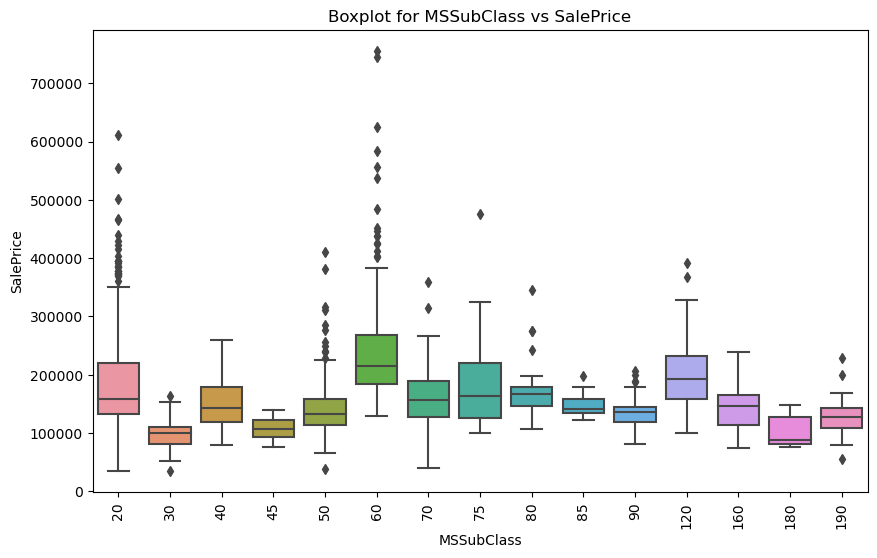

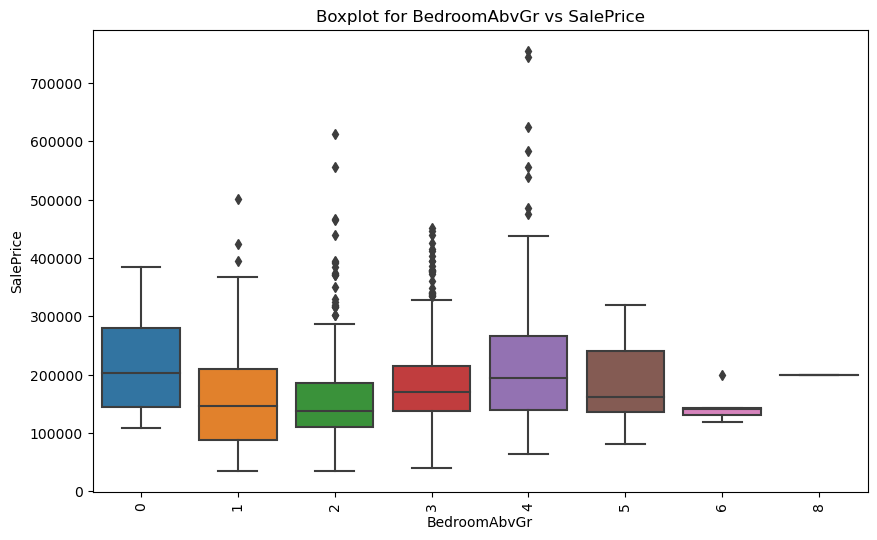

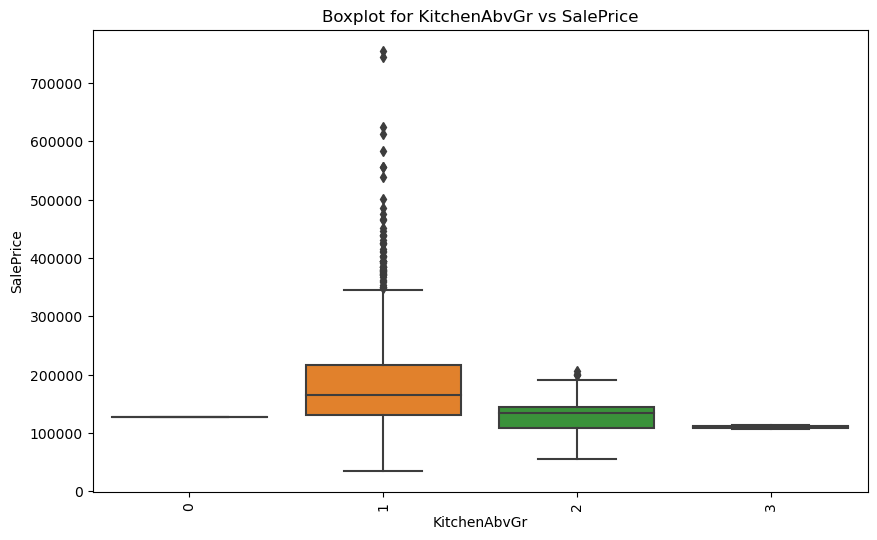

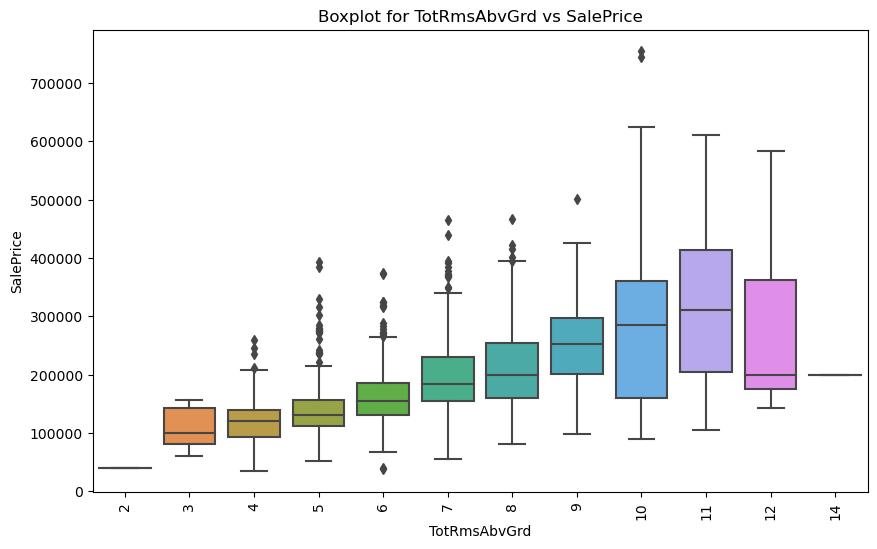

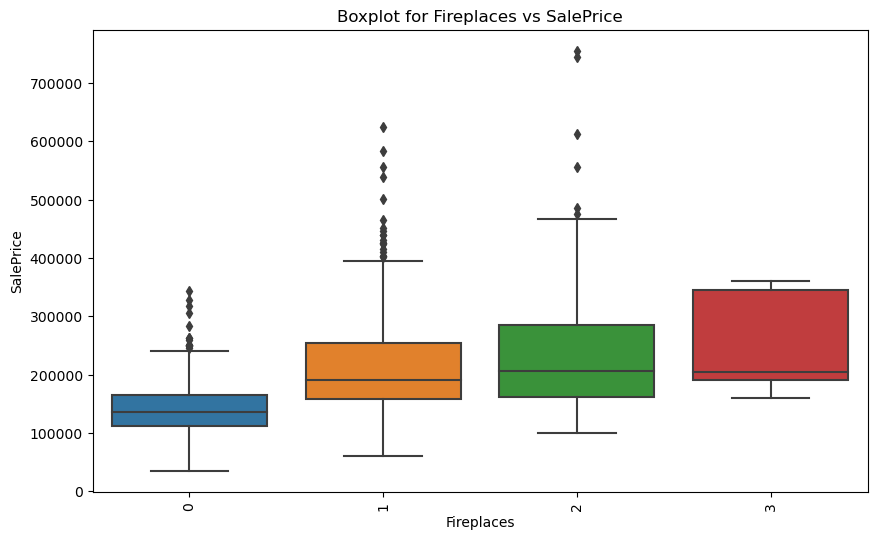

...

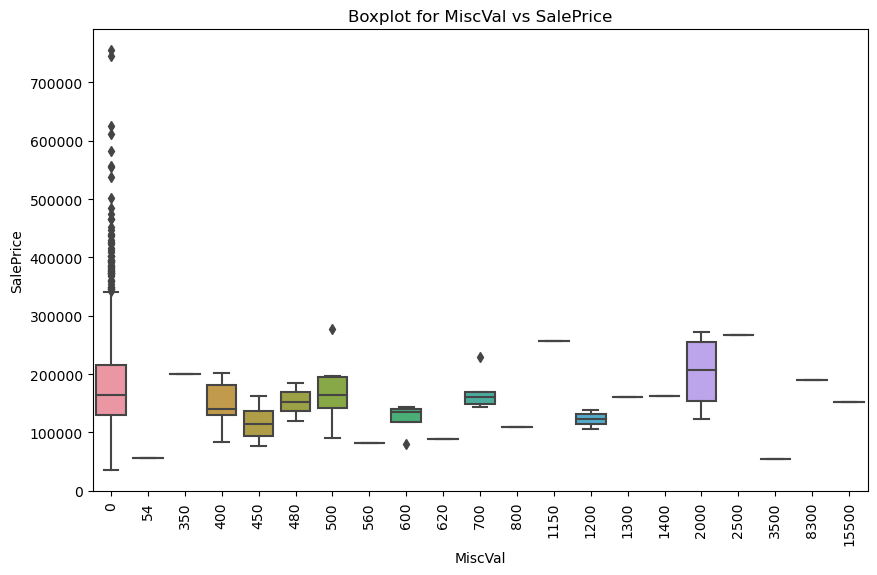

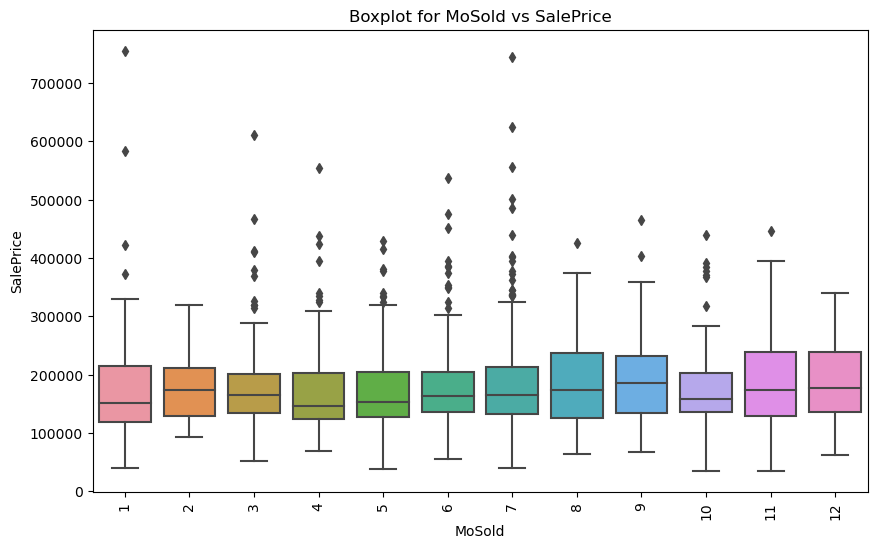

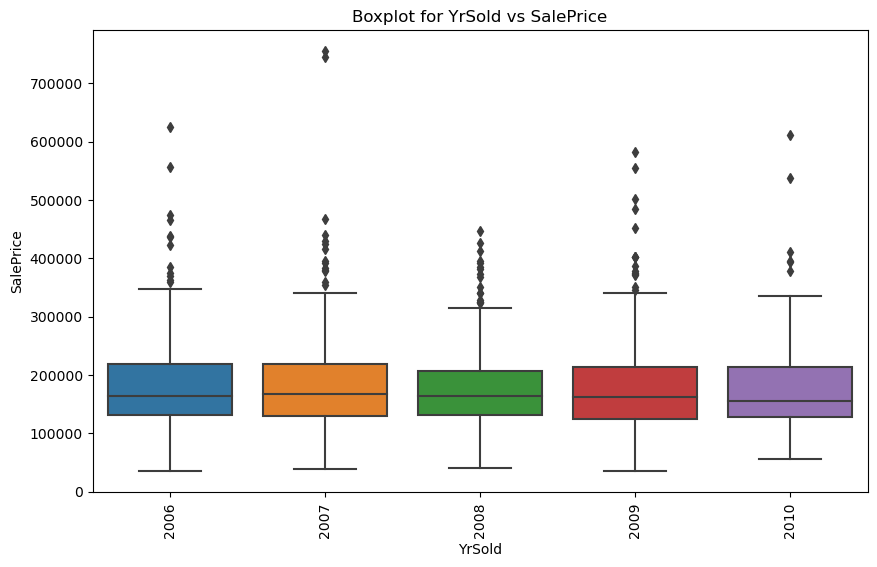

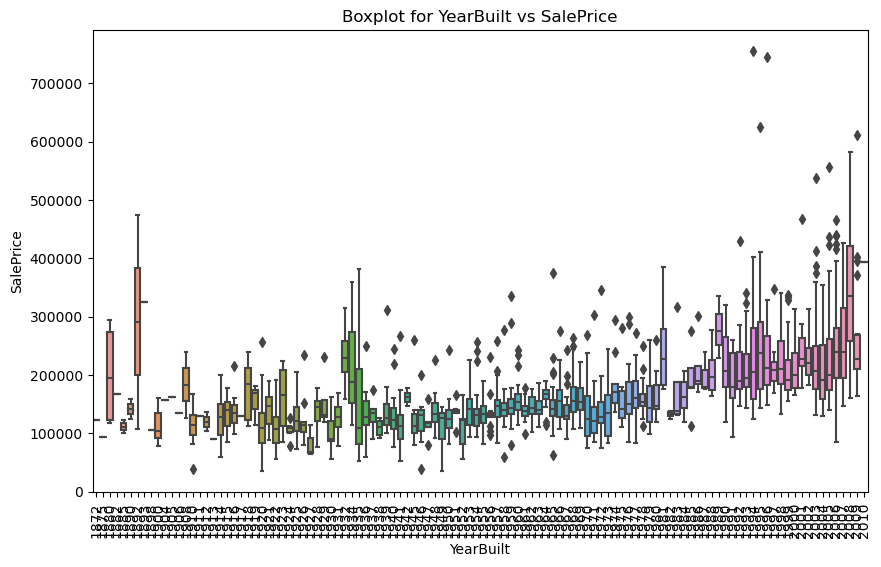

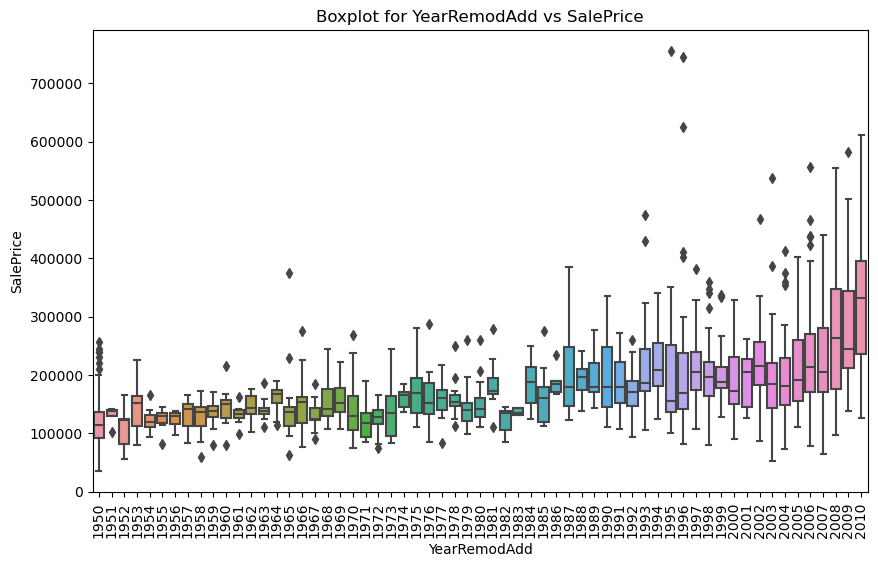

In [18]:
columns_to_exclude = ['SalePrice']  # List of columns to exclude

# Select all columns except 'SalePrice'
columns_to_plot = [col for col in train2_g.columns if col not in columns_to_exclude]

# Create boxplots for each column against 'SalePrice'
for col in columns_to_plot:
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    sns.boxplot(data=train2_g, x=col, y='SalePrice')
    plt.title(f'Boxplot for {col} vs SalePrice')
    plt.xlabel(col)
    plt.ylabel('SalePrice')
    plt.xticks(rotation=90)  
    plt.show()

## Note : 
As we observe our dataset, we notice that some variables exhibit high skewness and contain outliers. To address skewness, we can consider applying transformations such as square root (sqrt) transformation or Box-Cox transformation, among others. However, before we proceed with any data modifications, it's essential to obtain permission from our senior, as altering the dataset can have significant implications. For now, let's set aside these issues and proceed to the next step in our analysis.

## Before building a model Lets explore Test data

In [19]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [20]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1459.0,2190.000000,421.321334,1461.0,1825.50,2190.0,2554.50,2919.0
MSSubClass,1459.0,57.378341,42.746880,20.0,20.00,50.0,70.00,190.0
LotFrontage,1232.0,68.580357,22.376841,21.0,58.00,67.0,80.00,200.0
LotArea,1459.0,9819.161069,4955.517327,1470.0,7391.00,9399.0,11517.50,56600.0
OverallQual,1459.0,6.078821,1.436812,1.0,5.00,6.0,7.00,10.0
OverallCond,1459.0,5.553804,1.113740,1.0,5.00,5.0,6.00,9.0
YearBuilt,1459.0,1971.357779,30.390071,1879.0,1953.00,1973.0,2001.00,2010.0
YearRemodAdd,1459.0,1983.662783,21.130467,1950.0,1963.00,1992.0,2004.00,2010.0
MasVnrArea,1444.0,100.709141,177.625900,0.0,0.00,0.0,164.00,1290.0
BsmtFinSF1,1458.0,439.203704,455.268042,0.0,0.00,350.5,753.50,4010.0


Chexking NA values for Test Dataset and than mean and median value for numerical variables and mode value for categorical variables

In [21]:
for col in test.columns:
    na_count = test[col].isna().sum()
    percentage_na = (na_count / 1460) * 100
    data_type = test[col].dtype

    if data_type == 'int64' or data_type == 'float64':
        mean_value = test[col].mean()
        median_value = test[col].median()
        print(f"Column Name: {col}")
        print(f"Total NA Values: {na_count}")
        print(f"Percentage NA Values: {percentage_na:.2f}%")
        print(f"Data Type: {data_type}")
        print(f"Mean Value: {mean_value:.2f}")
        print(f"Median Value: {median_value:.2f}")
        print()
    elif data_type == 'object':
        mode_value = test[col].mode().values[0]
        print(f"Column Name: {col}")
        print(f"Total NA Values: {na_count}")
        print(f"Percentage NA Values: {percentage_na:.2f}%")
        print(f"Data Type: {data_type}")
        print(f"Mode Value: {mode_value}")
        print()

Column Name: Id
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: int64
Mean Value: 2190.00
Median Value: 2190.00

Column Name: MSSubClass
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: int64
Mean Value: 57.38
Median Value: 50.00

Column Name: MSZoning
Total NA Values: 4
Percentage NA Values: 0.27%
Data Type: object
Mode Value: RL

Column Name: LotFrontage
Total NA Values: 227
Percentage NA Values: 15.55%
Data Type: float64
Mean Value: 68.58
Median Value: 67.00

Column Name: LotArea
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: int64
Mean Value: 9819.16
Median Value: 9399.00

Column Name: Street
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: object
Mode Value: Pave

Column Name: Alley
Total NA Values: 1352
Percentage NA Values: 92.60%
Data Type: object
Mode Value: Grvl

Column Name: LotShape
Total NA Values: 0
Percentage NA Values: 0.00%
Data Type: object
Mode Value: Reg

Column Name: LandContour
Total NA Values: 0
Percentage NA Values: 0.00%
D

Same Rule if NA value is less than 5% than we can drop them or replace them but if NA value is above 80% its necessary to drop the column because it will change the data

In [22]:
test1 = test.copy()
test1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [23]:
for col in test1.columns:
    na_count = test1[col].isna().sum()
    percentage_na = (na_count / 1460) * 100
    data_type = test1[col].dtype

    if percentage_na >= 80:
        # Drop the column if more than 80% of the values are missing
        test1.drop(col, axis=1, inplace=True)
        print(f"Column '{col}' has {percentage_na:.2f}% NA values and is dropped.\n")
    elif na_count == 0:
        # If there are no NA values, print that we don't need to fill this column
        print(f"Column '{col}' has no NA values. No filling required.\n")
    else:
        if data_type == 'int64' or data_type == 'float64':
            # Fill NA values with median for numeric columns
            median_value = test1[col].median()
            test1[col].fillna(median_value, inplace=True)
            print(f"Column '{col}' (dtype: {data_type}) NA values filled with median value: {median_value:.2f}")
        elif data_type == 'object':
            # Fill NA values with mode for object columns
            mode_value = test1[col].mode().values[0]
            test1[col].fillna(mode_value, inplace=True)
            print(f"\nColumn '{col}' (dtype: {data_type}) NA values filled with mode value: {mode_value}")

Column 'Id' has no NA values. No filling required.

Column 'MSSubClass' has no NA values. No filling required.


Column 'MSZoning' (dtype: object) NA values filled with mode value: RL
Column 'LotFrontage' (dtype: float64) NA values filled with median value: 67.00
Column 'LotArea' has no NA values. No filling required.

Column 'Street' has no NA values. No filling required.

Column 'Alley' has 92.60% NA values and is dropped.

Column 'LotShape' has no NA values. No filling required.

Column 'LandContour' has no NA values. No filling required.


Column 'Utilities' (dtype: object) NA values filled with mode value: AllPub
Column 'LotConfig' has no NA values. No filling required.

Column 'LandSlope' has no NA values. No filling required.

Column 'Neighborhood' has no NA values. No filling required.

Column 'Condition1' has no NA values. No filling required.

Column 'Condition2' has no NA values. No filling required.

Column 'BldgType' has no NA values. No filling required.

Column 'HouseSty

In [24]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1459 non-null   object 
 3   LotFrontage    1459 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   LotShape       1459 non-null   object 
 7   LandContour    1459 non-null   object 
 8   Utilities      1459 non-null   object 
 9   LotConfig      1459 non-null   object 
 10  LandSlope      1459 non-null   object 
 11  Neighborhood   1459 non-null   object 
 12  Condition1     1459 non-null   object 
 13  Condition2     1459 non-null   object 
 14  BldgType       1459 non-null   object 
 15  HouseStyle     1459 non-null   object 
 16  OverallQual    1459 non-null   int64  
 17  OverallCond    1459 non-null   int64  
 18  YearBuil

### we are done with treating NA values 
### Next Step, lets Convert categorical variables into numeric form by using Label Encoding Technique

Before converting them check whether the values of categorical variables from both train and test dataset are same or different
if they are different than remove them from dataset to avoid error or wrong predictions.

In [25]:
all_columns_train = train1.columns
all_columns_test = test1.columns

# Identify categorical columns in train and test dataframes
categorical_columns_train = all_columns_train[train1.dtypes == 'object']  # Assuming categorical columns are of type 'object'
categorical_columns_test = all_columns_test[test1.dtypes == 'object']

# Iterate through each categorical column in the train dataset
for col in categorical_columns_train:
    # Check if the column is also in the test dataset
    if col in categorical_columns_test:
        # Get the unique values in the train and test data
        unique_values_train = set(train1[col].unique())
        unique_values_test = set(test1[col].unique())
        
        # Check if the unique values are different
        if unique_values_train != unique_values_test:
            print(f"\nThe unique values in column '{col}' are different between train and test data.")
            
            # Find and print the differences
            train_diff = unique_values_train - unique_values_test
            test_diff = unique_values_test - unique_values_train
            
            if train_diff:
                print(f"Values present in train but not in test: {train_diff}")
            if test_diff:
                print(f"Values present in test but not in train: {test_diff}")
        else:
            print(f"\nThe unique values in column '{col}' are the same between train and test data.")
    else:
        print(f"\nColumn '{col}' exists in the train data but not in the test data.")

# Check for categorical columns that exist in the test data but not in the train data
for col in categorical_columns_test:
    if col not in categorical_columns_train:
        print(f"\nColumn '{col}' exists in the test data but not in the train data.")


The unique values in column 'MSZoning' are the same between train and test data.

The unique values in column 'Street' are the same between train and test data.

The unique values in column 'LotShape' are the same between train and test data.

The unique values in column 'LandContour' are the same between train and test data.

The unique values in column 'Utilities' are different between train and test data.
Values present in train but not in test: {'NoSeWa'}

The unique values in column 'LotConfig' are the same between train and test data.

The unique values in column 'LandSlope' are the same between train and test data.

The unique values in column 'Neighborhood' are the same between train and test data.

The unique values in column 'Condition1' are the same between train and test data.

The unique values in column 'Condition2' are different between train and test data.
Values present in train but not in test: {'RRAn', 'RRNn', 'RRAe'}

The unique values in column 'BldgType' are the 

In [26]:
columns = ['Utilities', 'Condition2', 'HouseStyle', 'RoofMatl',
'Exterior1st', 'Exterior2nd', 'Heating', 'Electrical',
'GarageQual']

In [27]:
train_drop = train1[['Utilities', 'Condition2', 'HouseStyle', 'RoofMatl',
'Exterior1st', 'Exterior2nd', 'Heating', 'Electrical',
'GarageQual']]
train_drop.head()

,Utilities,Condition2,HouseStyle,RoofMatl,Exterior1st,Exterior2nd,Heating,Electrical,GarageQual
0,AllPub,Norm,2Story,CompShg,VinylSd,VinylSd,GasA,SBrkr,TA
1,AllPub,Norm,1Story,CompShg,MetalSd,MetalSd,GasA,SBrkr,TA
2,AllPub,Norm,2Story,CompShg,VinylSd,VinylSd,GasA,SBrkr,TA
3,AllPub,Norm,2Story,CompShg,Wd Sdng,Wd Shng,GasA,SBrkr,TA
4,AllPub,Norm,2Story,CompShg,VinylSd,VinylSd,GasA,SBrkr,TA


In [28]:
for col in train_drop.columns:
    value_counts = train_drop[col].value_counts()
    print(f"Column '{col}':")
    print(value_counts)

Column 'Utilities':
Utilities
AllPub    1459
NoSeWa       1
Name: count, dtype: int64
Column 'Condition2':
Condition2
Norm      1445
Feedr        6
Artery       2
RRNn         2
PosN         2
PosA         1
RRAn         1
RRAe         1
Name: count, dtype: int64
Column 'HouseStyle':
HouseStyle
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: count, dtype: int64
Column 'RoofMatl':
RoofMatl
CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Metal         1
Membran       1
Roll          1
ClyTile       1
Name: count, dtype: int64
Column 'Exterior1st':
Exterior1st
VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: count, dtype: int64
Column 'Exterior2nd':
Exterior2nd
VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywo

The count is 26 for those values which is present in train dataset but not in test dataset
well its safe to drop them then we still have 1434 rows or we can also replace them using mode()

To replace values in the train dataset that are present in the train dataset but not in the test dataset with the values that have the maximum frequency in that column in the train dataset

In [29]:
for col in categorical_columns_train:
    # Check if the column is also in the test dataset
    if col in categorical_columns_test:
        # Get the unique values in the train and test data
        unique_values_train = set(train1[col].unique())
        unique_values_test = set(test1[col].unique())
        
        # Check if there are values in train but not in test
        values_to_replace = unique_values_train - unique_values_test
        
        # If there are values to replace, find the most frequent value in the train dataset for this column
        if values_to_replace:
            most_frequent_value = train1[col].mode().iloc[0]  # Get the mode (most frequent value)
            
            # Replace the values in train dataset with the most frequent value
            train1[col] = train1[col].replace(list(values_to_replace), most_frequent_value)
            
            print(f"\nReplaced values in train data for '{col}' with most frequent value: {most_frequent_value}")
    else:
        print(f"\nColumn '{col}' exists in the train data but not in the test data.")


Replaced values in train data for 'Utilities' with most frequent value: AllPub

Replaced values in train data for 'Condition2' with most frequent value: Norm

Replaced values in train data for 'HouseStyle' with most frequent value: 1Story

Replaced values in train data for 'RoofMatl' with most frequent value: CompShg

Replaced values in train data for 'Exterior1st' with most frequent value: VinylSd

Replaced values in train data for 'Exterior2nd' with most frequent value: VinylSd

Replaced values in train data for 'Heating' with most frequent value: GasA

Replaced values in train data for 'Electrical' with most frequent value: SBrkr

Replaced values in train data for 'GarageQual' with most frequent value: TA


## Now we are set to convert categorical column to convert it into numerical labels

In [30]:
categorical_columns = train1.select_dtypes(include=['object']).columns.tolist()
categorical_columns

['MSZoning',
 'Street',
 'LotShape',
 'LandContour',
 'Utilities',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'Condition2',
 'BldgType',
 'HouseStyle',
 'RoofStyle',
 'RoofMatl',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinType2',
 'Heating',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 'KitchenQual',
 'Functional',
 'FireplaceQu',
 'GarageType',
 'GarageFinish',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'SaleType',
 'SaleCondition']

In [31]:
from sklearn.preprocessing import LabelEncoder

# Initialize a dictionary to store LabelEncoders for each column as we will use each instance for eac column in both dataset
label_encoders = {}

# Apply label encoding to train dataset
for col in categorical_columns:
    label_encoder = LabelEncoder()
    train1[col] = label_encoder.fit_transform(train1[col])
    label_encoders[col] = label_encoder  # Store the LabelEncoder for later use

# Apply label encoding to test dataset using the same LabelEncoders
for col in categorical_columns:
    label_encoder = label_encoders[col]  # Retrieve the LabelEncoder for this column
    test1[col] = label_encoder.transform(test1[col])

# Now, train1 and test1 have label-encoded categorical columns with consistent labels
train1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,3,65.0,8450,1,3,3,0,4,...,0,0,0,0,0,2,2008,8,4,208500
1,2,20,3,80.0,9600,1,3,3,0,2,...,0,0,0,0,0,5,2007,8,4,181500
2,3,60,3,68.0,11250,1,0,3,0,4,...,0,0,0,0,0,9,2008,8,4,223500
3,4,70,3,60.0,9550,1,0,3,0,0,...,272,0,0,0,0,2,2006,8,0,140000
4,5,60,3,84.0,14260,1,0,3,0,2,...,0,0,0,0,0,12,2008,8,4,250000


In [32]:
test1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,2,80.0,11622,1,3,3,0,4,...,0,0,0,120,0,0,6,2010,8,4
1,1462,20,3,81.0,14267,1,0,3,0,0,...,36,0,0,0,0,12500,6,2010,8,4
2,1463,60,3,74.0,13830,1,0,3,0,4,...,34,0,0,0,0,0,3,2010,8,4
3,1464,60,3,78.0,9978,1,0,3,0,4,...,36,0,0,0,0,0,6,2010,8,4
4,1465,120,3,43.0,5005,1,0,1,0,4,...,82,0,0,144,0,0,1,2010,8,4


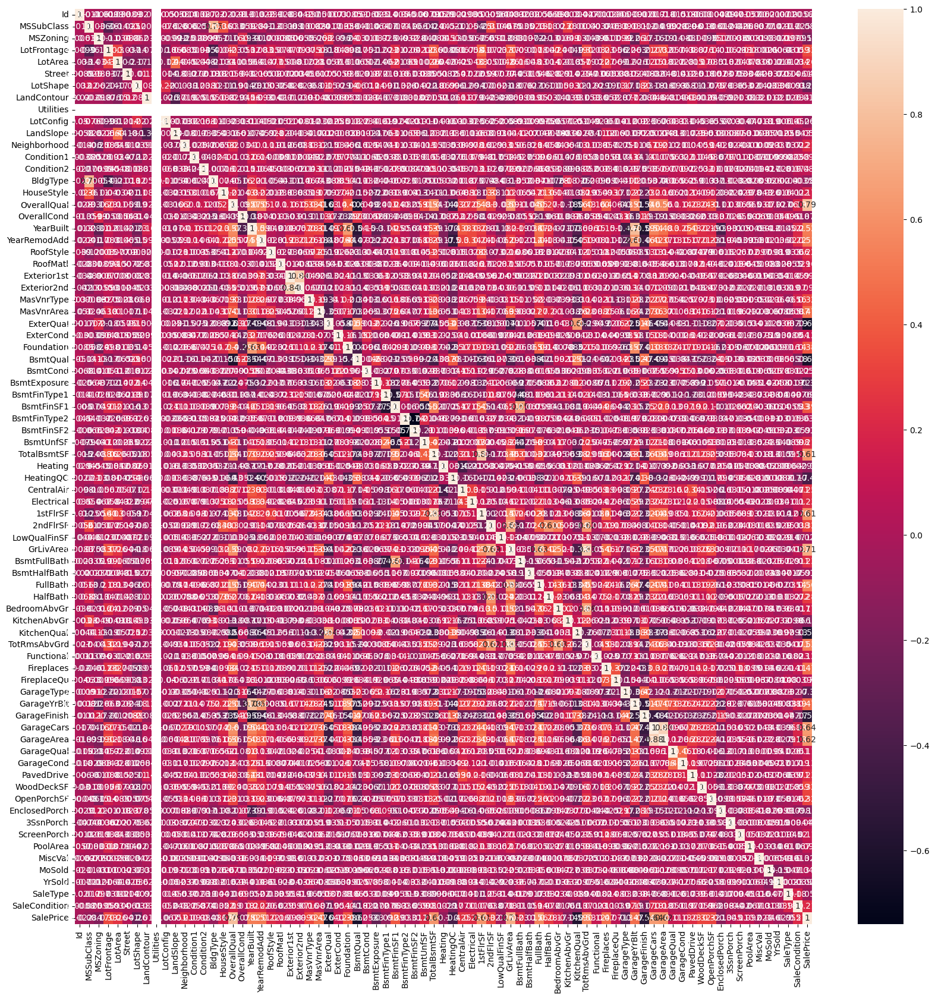

In [37]:
# Let us study the heat map Correlation for multi-collinearity to check assumption 5
plt.figure(figsize=(20,20))
sns.heatmap(train1.corr(), annot=True)
plt.show()

### Feature Selection using Correlation

In [43]:
# Selects the 50 columns with the largest correlation values with respect to the 'SalePrice' column using the .nlargest() method.
train1_corr = train1.corr(method='pearson')
corr_50col = train1_corr.nlargest(50, 'SalePrice').index
corr_50col

Index(['SalePrice', 'OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea',
       'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'Fireplaces', 'GarageYrBlt', 'BsmtFinSF1',
       'Foundation', 'LotFrontage', 'WoodDeckSF', 'MasVnrType', '2ndFlrSF',
       'OpenPorchSF', 'HalfBath', 'LotArea', 'CentralAir', 'PavedDrive',
       'Electrical', 'BsmtFullBath', 'RoofStyle', 'BsmtUnfSF', 'SaleCondition',
       'Neighborhood', 'HouseStyle', 'BedroomAbvGr', 'RoofMatl', 'GarageCond',
       'ExterCond', 'Functional', 'GarageQual', 'ScreenPorch', 'Exterior2nd',
       'Exterior1st', 'PoolArea', 'Condition1', 'Condition2', 'FireplaceQu',
       'BsmtCond', 'LandSlope', 'MoSold', '3SsnPorch', 'Street'],
      dtype='object')

In [44]:
trainF = train1[corr_50col]
trainF.head()

,SalePrice,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,...,Exterior1st,PoolArea,Condition1,Condition2,FireplaceQu,BsmtCond,LandSlope,MoSold,3SsnPorch,Street
0,208500,7,1710,2,548,856,856,2,8,2003,...,10,0,2,2,2,3,0,2,0,1
1,181500,6,1262,2,460,1262,1262,2,6,1976,...,7,0,1,2,4,3,0,5,0,1
2,223500,7,1786,2,608,920,920,2,6,2001,...,10,0,2,2,4,3,0,9,0,1
3,140000,7,1717,3,642,756,961,1,7,1915,...,11,0,2,2,2,1,0,2,0,1
4,250000,8,2198,3,836,1145,1145,2,9,2000,...,10,0,2,2,4,3,0,12,0,1


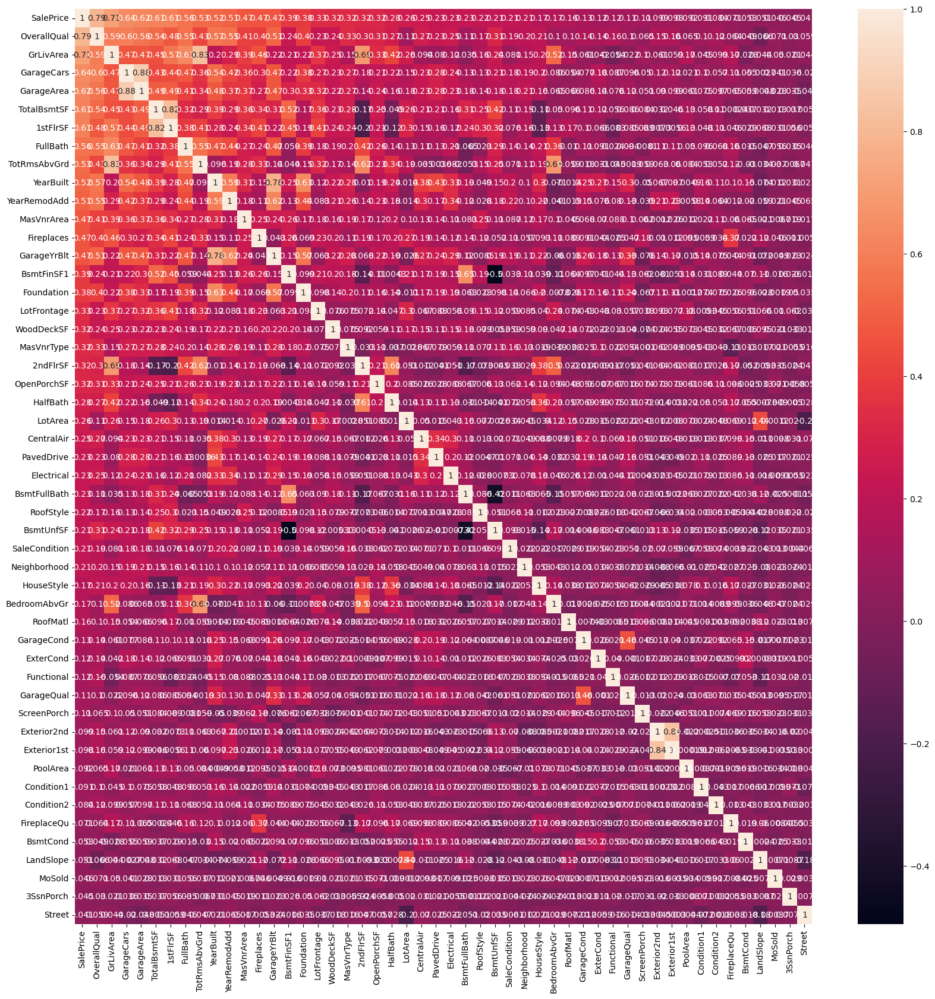

In [45]:
plt.figure(figsize=(20,20))
sns.heatmap(trainF.corr(), annot=True)
plt.show()

In [46]:
# with the following function we can select highly correlated features
# it will remove all the features that is highly correlated with any other feature

def correlation_var(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            # we comparing correlation value between the independent variable with the set threshold value
            if (corr_matrix.iloc[i, j]) > threshold: # we are interested in coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [47]:
# taking count of highly correlated feature 
# It is said that we should set threshold value at 0.75 so that we can remove highly correlated features
# while observing heatmap we observed that we dont have high correlation between independent features
corr_features = correlation_var(trainF, 0.7)
len(set(corr_features))

7

In [205]:
corr_features

{'1stFlrSF',
 'Exterior1st',
 'GarageArea',
 'GarageYrBlt',
 'GrLivArea',
 'OverallQual',
 'TotRmsAbvGrd'}

In [206]:
trainF.shape

(1460, 50)

In [207]:
trainF_corr = trainF.drop(corr_features,axis=1)
trainF_corr.columns

Index(['SalePrice', 'GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt',
       'YearRemodAdd', 'MasVnrArea', 'Fireplaces', 'BsmtFinSF1', 'Foundation',
       'LotFrontage', 'WoodDeckSF', 'MasVnrType', '2ndFlrSF', 'OpenPorchSF',
       'HalfBath', 'LotArea', 'CentralAir', 'PavedDrive', 'Electrical',
       'BsmtFullBath', 'RoofStyle', 'BsmtUnfSF', 'SaleCondition',
       'Neighborhood', 'HouseStyle', 'BedroomAbvGr', 'RoofMatl', 'GarageCond',
       'ExterCond', 'Functional', 'GarageQual', 'ScreenPorch', 'Exterior2nd',
       'PoolArea', 'Condition1', 'Condition2', 'FireplaceQu', 'BsmtCond',
       'LandSlope', 'MoSold', '3SsnPorch', 'Street'],
      dtype='object')

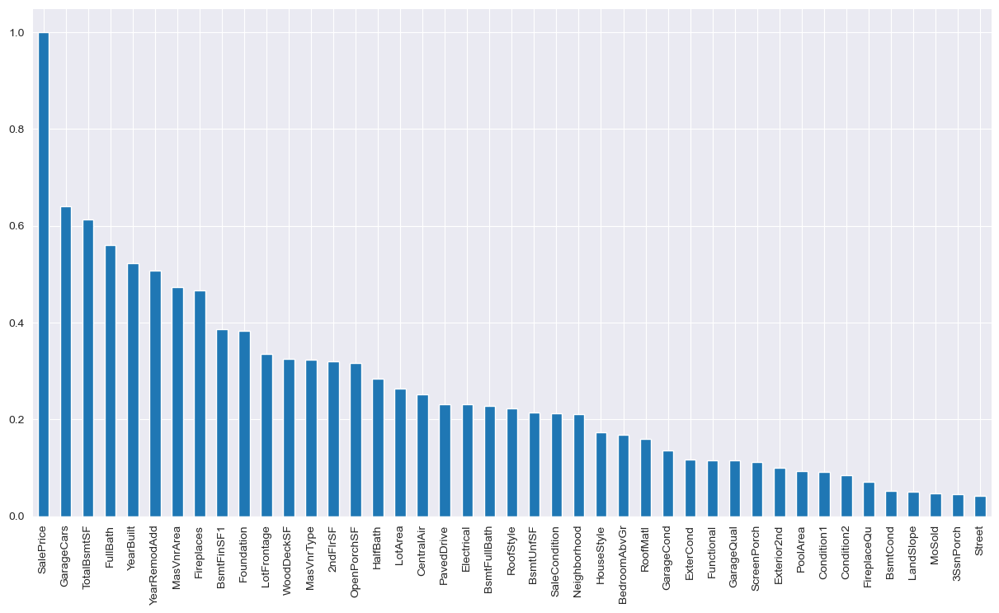

In [208]:
# correlation of 'SalePrice' with other variables
plt.figure(figsize=(15,8))
trainF_corr.corr()['SalePrice'].sort_values(ascending = False).plot(kind='bar')
plt.show()

## Model Building

In [209]:
from sklearn.model_selection import train_test_split
x_train, x_test,y_train, y_test =train_test_split(trainF_corr.drop('SalePrice',axis=1),trainF_corr['SalePrice'],random_state=42,test_size=0.2)

In [210]:
x_train.head()

,GarageCars,TotalBsmtSF,FullBath,YearBuilt,YearRemodAdd,MasVnrArea,Fireplaces,BsmtFinSF1,Foundation,LotFrontage,...,Exterior2nd,PoolArea,Condition1,Condition2,FireplaceQu,BsmtCond,LandSlope,MoSold,3SsnPorch,Street
254,1,1314,1,1957,1957,0.0,0,922,1,70.0,...,8,0,2,2,2,3,0,6,0,1
1066,2,799,2,1993,1994,0.0,1,0,2,59.0,...,12,0,2,2,4,3,0,5,0,1
638,0,796,1,1910,1950,0.0,0,0,1,67.0,...,13,0,1,2,2,3,0,5,0,1
799,1,731,1,1937,1950,252.0,2,569,0,60.0,...,13,0,1,2,4,3,0,6,0,1
380,1,1026,2,1924,1950,0.0,1,218,0,50.0,...,13,0,2,2,2,3,0,5,0,1


In [211]:
x_test.head()

,GarageCars,TotalBsmtSF,FullBath,YearBuilt,YearRemodAdd,MasVnrArea,Fireplaces,BsmtFinSF1,Foundation,LotFrontage,...,Exterior2nd,PoolArea,Condition1,Condition2,FireplaceQu,BsmtCond,LandSlope,MoSold,3SsnPorch,Street
892,1,1059,1,1963,2003,0.0,0,663,1,70.0,...,6,0,2,2,2,3,0,2,0,1
1105,2,1463,2,1994,1995,362.0,2,1032,2,98.0,...,6,0,2,2,4,3,0,4,0,1
413,2,1008,1,1927,1950,0.0,1,0,1,56.0,...,14,0,0,2,2,3,0,3,0,1
522,2,1004,2,1947,1950,0.0,2,399,1,50.0,...,5,0,1,2,2,3,0,10,0,1
1036,3,1620,2,2007,2008,70.0,1,1022,2,89.0,...,12,0,2,2,0,3,0,9,0,1


In [212]:
y_train

254     145000
1066    178000
638      85000
799     175000
380     127000
         ...  
1095    176432
1130    135000
1294    115000
860     189950
1126    174000
Name: SalePrice, Length: 1168, dtype: int64

## Linear Regression

In [213]:
from sklearn.linear_model import LinearRegression
lrm = LinearRegression()
lrm.fit(x_train, y_train)
print('Intercept is: ',lrm.intercept_)
print('Coeff_of determination R^2 is: ',lrm.score(x_train,y_train)) # R^2 is of train dataset
print("Coef for Variable are:\n",lrm.coef_)

Intercept is:  -1539790.33892262
Coeff_of determination R^2 is:  0.7612990858890548
Coef for Variable are:
 [ 1.90025999e+04  4.64776704e+01  1.16011272e+04  2.16665772e+02
  5.48015415e+02  3.58493332e+01  1.97131391e+04  5.54682440e+00
  5.68721757e+03  3.62235874e+01  2.87056926e+01  1.17193905e+04
  5.02658753e+01  1.42517614e+01 -1.77333996e+03  2.60357780e-01
  2.40928265e+03  1.02916123e+03 -2.66465769e+03  8.04974860e+03
  6.98474462e+03 -1.08936904e+00  2.28592621e+03  6.58581312e+02
 -2.20981895e+03 -2.29091950e+03  2.10517560e+04  1.84069838e+03
 -2.92785523e+03  3.54301209e+03 -1.01574841e+03  5.91371777e+01
  9.85853550e+01 -2.14034311e+01  1.39885159e+03 -1.57018451e+04
 -6.95339873e+03  2.88151571e+03  1.23887295e+04  2.04901286e+01
  5.13074634e+01  4.65798134e+04]


In [214]:
Co_Eff = pd.DataFrame(lrm.coef_.transpose(),x_test.columns,columns=['Coefficient'])
Co_Eff

,Coefficient
GarageCars,19002.599891
TotalBsmtSF,46.477670
FullBath,11601.127243
YearBuilt,216.665772
YearRemodAdd,548.015415
MasVnrArea,35.849333
Fireplaces,19713.139105
BsmtFinSF1,5.546824
Foundation,5687.217572
LotFrontage,36.223587


In [215]:
y_pred = lrm.predict(x_test)

In [216]:
## Evaluation of model using MAE/MAPE (mean of absolute error which is the difference between actual and predicted values)
## MSE (mean value of squared error), RMSE (interprets error in terms of Y)

from sklearn import metrics
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE 25652.29721967349
MSE 1571781787.1426897
RMSE 39645.70326205211


In [217]:
from sklearn.metrics import r2_score
print("R-Squared of test_data : ",r2_score(y_test,y_pred))  ## This is for Test data

R-Squared of test_data :  0.7950827976951066


In [218]:
import statsmodels.api as sm

In [219]:
# lets look at the other parameter using Stats Model
x_train_sm = x_train
x_train_sm = sm.add_constant(x_train_sm)
model = sm.OLS(y_train,x_train_sm).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.761
Model:                            OLS   Adj. R-squared:                  0.752
Method:                 Least Squares   F-statistic:                     85.43
Date:                Sat, 07 Oct 2023   Prob (F-statistic):          2.85e-316
Time:                        17:16:46   Log-Likelihood:                -13966.
No. Observations:                1168   AIC:                         2.802e+04
Df Residuals:                    1125   BIC:                         2.824e+04
Df Model:                          42                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          -1.54e+06   1.84e+05     -8.356      0.000    -1.9e+06   -1.18e+06
GarageCars       1.9e+04   2110.815      9.002      0.000    1.49e+04    2.31e+04
TotalBsmtSF      46.4777      8.321      5.586      0.000      30.152      62.803
FullBath        1.16e+04   3312.029      3.503      0.000    5102.678    1.81e+04
YearBuilt       216.6658     75.752      2.860      0.004      68.035     365.296
YearRemodAdd    548.0154     78.446      6.986      0.000     394.099     701.932
MasVnrArea       35.8493      7.846      4.569      0.000      20.454      51.245
Fireplaces     1.971e+04   2215.809      8.897      0.000    1.54e+04    2.41e+04
BsmtFinSF1        5.5468      7.734      0.717      0.473      -9.627      20.721
Foundation     5687.2176   2084.429      2.728      0.006    1597.412    9777.023
LotFrontage      36.2236     59.221      0.612      0.541     -79.972     152.419
WoodDeckSF       28.7057      9.656      2.973      0.003       9.760      47.652
MasVnrType     1.172e+04   4087.370      2.867      0.004    3699.664    1.97e+04
2ndFlrSF         50.2659      4.745     10.593      0.000      40.956      59.576
OpenPorchSF      14.2518     18.217      0.782      0.434     -21.492      49.995
HalfBath      -1773.3400   3336.482     -0.531      0.595   -8319.767    4773.087
LotArea           0.2604      0.135      1.933      0.054      -0.004       0.525
CentralAir     2409.2826   5309.450      0.454      0.650   -8008.256    1.28e+04
PavedDrive     1029.1612   2660.897      0.387      0.699   -4191.718    6250.040
Electrical    -2664.6577   1696.367     -1.571      0.117   -5993.056     663.741
BsmtFullBath   8049.7486   3053.068      2.637      0.008    2059.401     1.4e+04
RoofStyle      6984.7446   1438.319      4.856      0.000    4162.655    9806.834
BsmtUnfSF        -1.0894      7.844     -0.139      0.890     -16.480      14.302
SaleCondition  2285.9262   1100.777      2.077      0.038     126.118    4445.734
Neighborhood    658.5813    200.204      3.290      0.001     265.765    1051.397
HouseStyle    -2209.8190    948.132     -2.331      0.020   -4070.125    -349.513
BedroomAbvGr  -2290.9195   1824.654     -1.256      0.210   -5871.027    1289.188
RoofMatl       2.105e+04   5384.151      3.910      0.000    1.05e+04    3.16e+04
GarageCond     1840.6984   2604.721      0.707      0.480   -3269.958    6951.355
ExterCond     -2927.8552   1625.118     -1.802      0.072   -6116.459     260.748
Functional     3543.0121   1204.565      2.941      0.003    1179.566    5906.458
GarageQual    -1015.7484   2433.285     -0.417      0.676   -5790.035    3758.538
ScreenPorch      59.1372     21.513      2.749      0.006      16.927     101.347
Exterior2nd      98.5854    389.999      0.253      0.800    -666.622     863.793
PoolArea        -21.4034     28.940     -0.740   

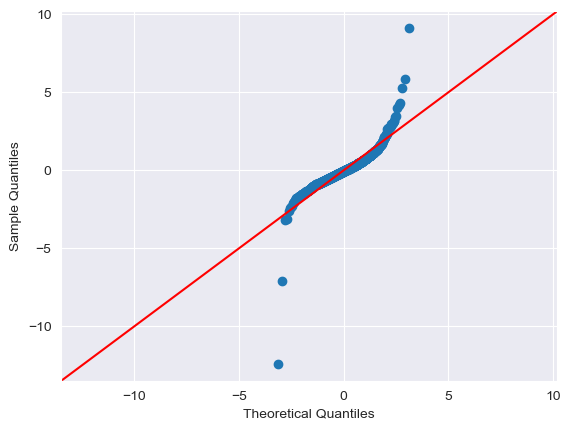

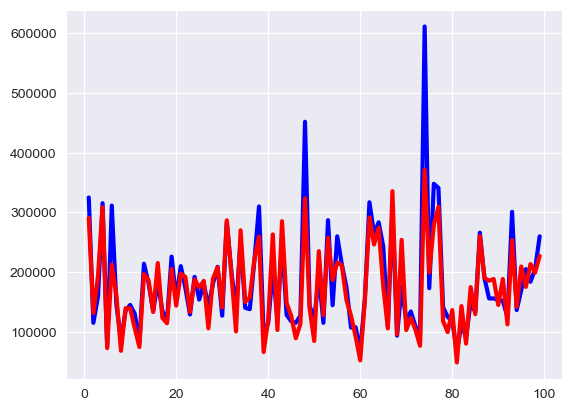

In [220]:
# define residual
res = model.resid
# create Q-Q plot
fig = sm.qqplot(res, fit=True, line="45")
plt.show()

## Not a promising plot .. so let us plot actual and predicted.. Since there are many values let us look at 100 values
cnt=[i for i in range(1,100,1)]
fig = plt.figure()
plt.plot(cnt,y_test[1:100],color="blue", linewidth=3,linestyle="-")  #Actual
plt.plot(cnt,y_pred[1:100],color="red", linewidth=3,linestyle="-")   #predicted
plt.show()

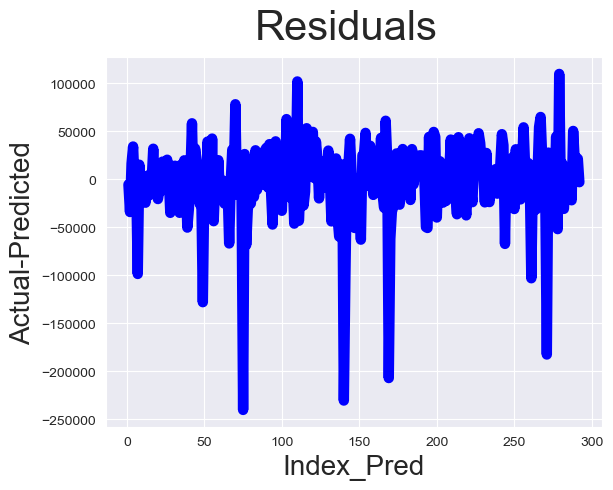

In [221]:
## Plotting the residuals 30% of 1470 = 441 
cnt = [i for i in range(1, len(y_pred) + 1)]
fig=plt.figure()
plt.plot(cnt,y_pred-y_test, color = 'blue', linewidth = 7.5, linestyle = '-')
fig.suptitle('Residuals',fontsize = 30)
plt.xlabel('Index_Pred', fontsize = 20)
plt.ylabel('Actual-Predicted', fontsize = 20)
plt.show()

## Decision Tree using Correlation Feature Selection

In [79]:
from sklearn.tree import DecisionTreeRegressor
DTR = DecisionTreeRegressor()
DTR.fit(x_train, y_train)
y_pred = DTR.predict(x_test)

In [222]:
from sklearn import metrics
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
r2_dtr = r2_score(y_test, y_pred)
print("R-squared DTR:", r2_dtr)
print('Coeff_of determination R^2 is: ',DTR.score(x_train,y_train)) # R^2 is of train dataset

MAE 25652.29721967349
MSE 1571781787.1426897
RMSE 39645.70326205211
R-squared DTR: 0.7950827976951066
Coeff_of determination R^2 is:  0.9999950556906533


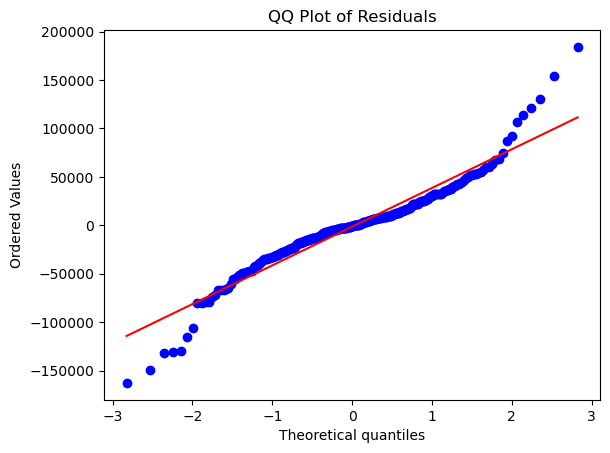

In [81]:
import scipy.stats as stats
#import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_test - y_pred

# Create a QQ plot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("QQ Plot of Residuals")
plt.show()

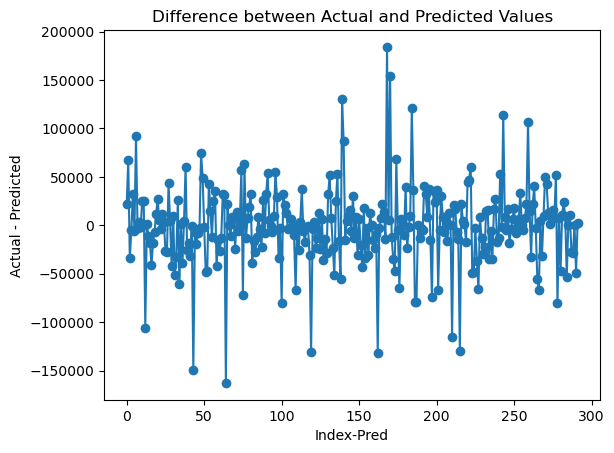

In [82]:
# Create a plot of the difference between actual and predicted values
plt.plot(range(len(y_test)), y_test - y_pred, marker='o', linestyle='-')
plt.xlabel("Index-Pred")
plt.ylabel("Actual - Predicted")
plt.title("Difference between Actual and Predicted Values")
plt.show()

## Random Forest using Correlation Feature Selection

In [223]:
from sklearn.ensemble import RandomForestRegressor
RF = RandomForestRegressor()
RF.fit(x_train, y_train)

RandomForestRegressor()

In [224]:
y_pred = RF.predict(x_test)

In [225]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

In [226]:
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-squared:", r2)

RMSE 31371.14110596526
Mean Absolute Error: 19548.48771689498
Mean Squared Error: 984148494.2903833
R-squared: 0.8716940495479537


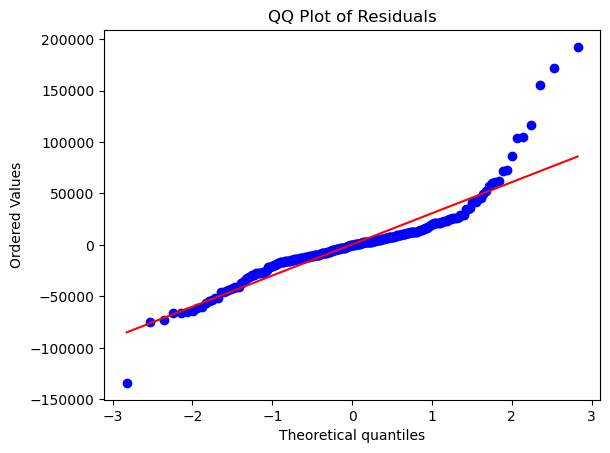

In [90]:
# Calculate residuals
residuals = y_test - y_pred

# Create a QQ plot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("QQ Plot of Residuals")
plt.show()

Text(0, 0.5, 'y_pred_rf')

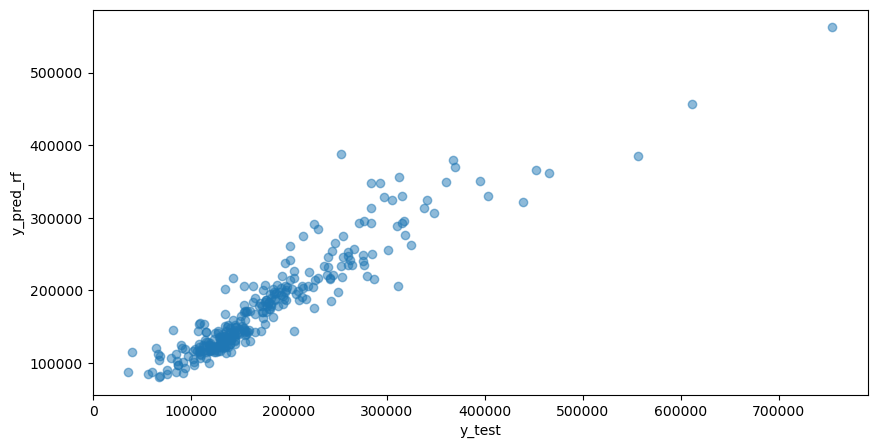

In [97]:
plt.figure(figsize=(10,5))
plt.scatter(x=y_test,y=y_pred,alpha=0.5)
plt.xlabel('y_test')
plt.ylabel('y_pred_rf')

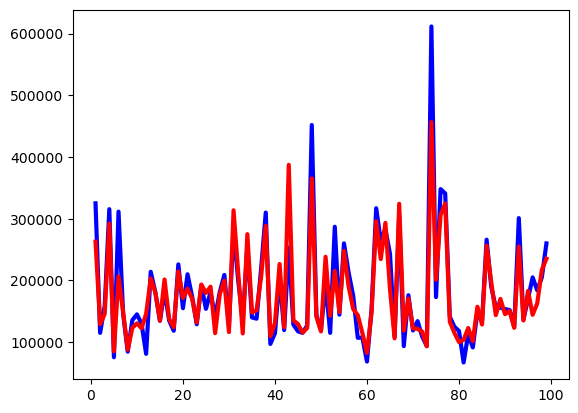

In [92]:
cnt=[i for i in range(1,100,1)]
# plt.figure(figsize=(20, 12))
plt.plot(cnt,y_test[1:100],color="blue", linewidth=3,linestyle="-")  #Actual
plt.plot(cnt,y_pred[1:100],color="red", linewidth=3,linestyle="-")   #predicted
plt.show()

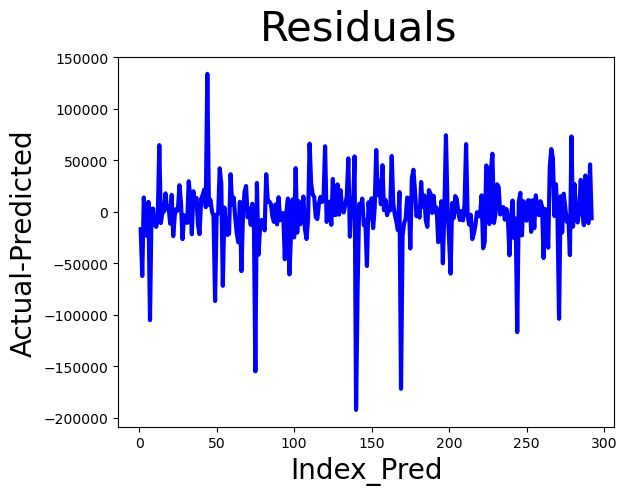

In [94]:
## Plotting the residuals 30% of 1470 = 441 
cnt = [i for i in range(1, len(y_pred) + 1)]
fig=plt.figure()
plt.plot(cnt,y_pred-y_test, color = 'blue', linewidth = 3, linestyle = '-')
fig.suptitle('Residuals',fontsize = 30)
plt.xlabel('Index_Pred', fontsize = 20)
plt.ylabel('Actual-Predicted', fontsize = 20)
plt.show()

Based on the evaluation metrics, we can make the following conclusions:

Random Forest Regression has the lowest Mean Absolute Error (MAE), which means it has the smallest average absolute difference between predicted and actual values.
Random Forest Regression also has the lowest Mean Squared Error (MSE), indicating that it has the smallest average squared difference between predicted and actual values.
Random Forest Regression has the highest R-squared value (0.8601), which means it explains the most variance in the data compared to the other models.
Considering these metrics, Random Forest Regression appears to be the best-performing model among the three options. It has lower errors and a higher R-squared value, indicating better predictive performance.

In [227]:
test1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,2,80.0,11622,1,3,3,0,4,...,0,0,0,120,0,0,6,2010,8,4
1,1462,20,3,81.0,14267,1,0,3,0,0,...,36,0,0,0,0,12500,6,2010,8,4
2,1463,60,3,74.0,13830,1,0,3,0,4,...,34,0,0,0,0,0,3,2010,8,4
3,1464,60,3,78.0,9978,1,0,3,0,4,...,36,0,0,0,0,0,6,2010,8,4
4,1465,120,3,43.0,5005,1,0,1,0,4,...,82,0,0,144,0,0,1,2010,8,4


In [228]:
columns = x_train.columns
columns

Index(['GarageCars', 'TotalBsmtSF', 'FullBath', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'Fireplaces', 'BsmtFinSF1', 'Foundation', 'LotFrontage',
       'WoodDeckSF', 'MasVnrType', '2ndFlrSF', 'OpenPorchSF', 'HalfBath',
       'LotArea', 'CentralAir', 'PavedDrive', 'Electrical', 'BsmtFullBath',
       'RoofStyle', 'BsmtUnfSF', 'SaleCondition', 'Neighborhood', 'HouseStyle',
       'BedroomAbvGr', 'RoofMatl', 'GarageCond', 'ExterCond', 'Functional',
       'GarageQual', 'ScreenPorch', 'Exterior2nd', 'PoolArea', 'Condition1',
       'Condition2', 'FireplaceQu', 'BsmtCond', 'LandSlope', 'MoSold',
       '3SsnPorch', 'Street'],
      dtype='object')

In [229]:
test_corr =test1[columns]
test_corr.head()

,GarageCars,TotalBsmtSF,FullBath,YearBuilt,YearRemodAdd,MasVnrArea,Fireplaces,BsmtFinSF1,Foundation,LotFrontage,...,Exterior2nd,PoolArea,Condition1,Condition2,FireplaceQu,BsmtCond,LandSlope,MoSold,3SsnPorch,Street
0,1.0,882.0,1,1961,1961,0.0,0,468.0,1,80.0,...,12,0,1,2,2,3,0,6,0,1
1,1.0,1329.0,1,1958,1958,108.0,0,923.0,1,81.0,...,13,0,2,2,2,3,0,6,0,1
2,2.0,928.0,2,1997,1998,0.0,1,791.0,2,74.0,...,12,0,2,2,4,3,0,3,0,1
3,2.0,926.0,2,1998,1998,20.0,1,602.0,2,78.0,...,12,0,2,2,2,3,0,6,0,1
4,2.0,1280.0,2,1992,1992,0.0,0,263.0,2,43.0,...,6,0,2,2,2,3,0,1,0,1


In [233]:
pred_test= RF.predict(test_corr)
submit_RF_corr = pd.DataFrame({
    'id' :test1['Id'],
    'SalePrice' : pred_test
})
submit_RF_corr.head()

,id,SalePrice
0,1461,120580.50
1,1462,151725.50
2,1463,191924.86
3,1464,185193.70
4,1465,185115.89


In [287]:
submit_RF_corr.to_csv('house_P_RF_corr.csv', index=False)

## Feature Selection by Mutual Information Gain and SelectKBest

In [259]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

In [260]:
train1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,3,65.0,8450,1,3,3,0,4,...,0,0,0,0,0,2,2008,8,4,208500
1,2,20,3,80.0,9600,1,3,3,0,2,...,0,0,0,0,0,5,2007,8,4,181500
2,3,60,3,68.0,11250,1,0,3,0,4,...,0,0,0,0,0,9,2008,8,4,223500
3,4,70,3,60.0,9550,1,0,3,0,0,...,272,0,0,0,0,2,2006,8,0,140000
4,5,60,3,84.0,14260,1,0,3,0,2,...,0,0,0,0,0,12,2008,8,4,250000


In [261]:
x_train, x_test,y_train, y_test =train_test_split(train1.drop('SalePrice',axis=1),train1['SalePrice'],random_state=42,test_size=0.2)

In [262]:
x_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
254,255,20,3,70.0,8400,1,3,3,0,4,...,0,0,0,0,0,0,6,2010,8,4
1066,1067,60,3,59.0,7837,1,0,3,0,4,...,40,0,0,0,0,0,5,2009,8,4
638,639,30,3,67.0,8777,1,3,3,0,4,...,0,164,0,0,0,0,5,2008,8,4
799,800,50,3,60.0,7200,1,3,3,0,0,...,0,264,0,0,0,0,6,2007,8,4
380,381,50,3,50.0,5000,1,3,3,0,4,...,0,242,0,0,0,0,5,2010,8,4


In [263]:
info = mutual_info_regression(x_train,y_train)
info

array([0.00106304, 0.27778753, 0.10708737, 0.17956085, 0.17382214,
       0.        , 0.06680077, 0.02383885, 0.00664291, 0.0134249 ,
       0.00537934, 0.46081698, 0.04042921, 0.00091826, 0.03835564,
       0.11733953, 0.53759513, 0.10258085, 0.3399815 , 0.23105003,
       0.01313169, 0.00124272, 0.15709932, 0.17838776, 0.04472663,
       0.07106071, 0.30116567, 0.03380773, 0.19723475, 0.31625556,
       0.03039729, 0.07207364, 0.16056567, 0.15383181, 0.        ,
       0.01771739, 0.15362375, 0.34717591, 0.03232065, 0.17780095,
       0.06552133, 0.03379216, 0.29761689, 0.21135339, 0.        ,
       0.45262411, 0.04515747, 0.        , 0.25966082, 0.06641417,
       0.04684283, 0.01228588, 0.30609072, 0.17925548, 0.00971112,
       0.1648174 , 0.09052148, 0.12655944, 0.27016972, 0.2636623 ,
       0.3529736 , 0.36366964, 0.        , 0.00891099, 0.06235201,
       0.07489043, 0.15698037, 0.02403459, 0.        , 0.01302068,
       0.        , 0.        , 0.        , 0.0116455 , 0.06215

In [264]:
info = pd.Series(info,index=x_train.columns)
info

Id               0.001063
MSSubClass       0.277788
MSZoning         0.107087
LotFrontage      0.179561
LotArea          0.173822
                   ...   
MiscVal          0.000000
MoSold           0.000000
YrSold           0.011645
SaleType         0.062157
SaleCondition    0.042506
Length: 76, dtype: float64

In [265]:
info.sort_values(ascending=False)

OverallQual     0.537595
Neighborhood    0.460817
GrLivArea       0.452624
GarageArea      0.363670
GarageCars      0.352974
                  ...   
PoolArea        0.000000
MiscVal         0.000000
MoSold          0.000000
LowQualFinSF    0.000000
Street          0.000000
Length: 76, dtype: float64

### SelectKBest

In [266]:
best_40 = SelectKBest(mutual_info_regression,k=40)
best_40.fit(x_train,y_train)

SelectKBest(k=40,
            score_func=<function mutual_info_regression at 0x0000023A406EE680>)

In [267]:
best_40.get_support()

array([False,  True,  True,  True,  True, False,  True, False, False,
       False, False,  True, False, False, False,  True,  True,  True,
        True,  True, False, False,  True,  True, False,  True,  True,
       False,  True,  True, False, False,  True,  True, False, False,
        True,  True, False,  True,  True, False,  True,  True, False,
        True, False, False,  True,  True, False, False,  True,  True,
       False,  True,  True,  True,  True,  True,  True,  True, False,
       False, False,  True,  True, False, False, False, False, False,
       False, False, False,  True])

In [268]:
x_train = x_train[x_train.columns[best_40.get_support()]]
x_train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,...,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SaleCondition
254,20,3,70.0,8400,3,12,2,5,6,1957,...,0,2,1,1957.0,1,1,294,250,0,4
1066,60,3,59.0,7837,0,8,4,6,7,1993,...,1,4,1,1993.0,1,2,380,0,40,4
638,30,3,67.0,8777,3,7,2,5,7,1910,...,0,2,1,1980.0,2,0,0,328,0,4
799,50,3,60.0,7200,3,18,0,5,7,1937,...,2,4,5,1939.0,2,1,240,0,0,4
380,50,3,50.0,5000,3,18,0,5,6,1924,...,1,2,5,1924.0,2,1,308,0,0,4


In [269]:
x_test = x_test[x_test.columns[best_40.get_support()]]
x_test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,...,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SaleCondition
892,20,3,70.0,8414,3,19,2,6,8,1963,...,0,2,1,1963.0,1,1,264,192,0,4
1105,60,3,98.0,12256,0,15,4,8,5,1994,...,2,4,1,1994.0,1,2,712,186,32,4
413,30,4,56.0,8960,3,17,2,5,6,1927,...,1,2,5,1927.0,2,2,360,0,0,4
522,50,4,50.0,5000,3,3,0,6,7,1947,...,2,2,5,1950.0,2,2,420,0,24,4
1036,20,3,89.0,12898,0,23,2,9,5,2007,...,1,0,1,2008.0,0,3,912,228,0,4


In [270]:
from sklearn.linear_model import LinearRegression
lrm_mi = LinearRegression()
lrm_mi.fit(x_train, y_train)
print('Intercept is: ',lrm_mi.intercept_)
print('Coeff_of determination R^2 is: ',lrm_mi.score(x_train,y_train)) # R^2 is of train dataset
print("Coef for Variable are:\n",lrm_mi.coef_)

Intercept is:  -430509.49517293496
Coeff_of determination R^2 is:  0.8297030638595662
Coef for Variable are:
 [-1.94735180e+02 -2.61183613e+03 -2.02333578e+02  5.10282792e-01
 -1.08102109e+03  2.29853385e+02 -4.55582319e+02  1.33448206e+04
  4.90303852e+03  1.91005320e+02  4.92787998e+01 -1.55147451e+03
  7.14829325e+02  2.01841655e+01 -7.17198469e+03  1.40029961e+03
 -1.11384150e+04 -1.32945197e+03  5.59109879e+00 -7.90480775e+00
  7.51565155e+00 -4.07345715e+02  2.91735165e+03  3.09539743e+00
  3.18842929e+00  3.88399406e+01 -3.62287805e+02 -7.55547135e+02
 -1.01172393e+04  2.03432749e+03  7.68123334e+03 -1.92626475e+03
 -1.16633214e+03  9.23350924e+00  5.52609746e+01  1.28561193e+04
 -4.85825615e-01  1.63559594e+01 -7.44176325e+00  1.42024677e+03]


In [271]:
y_pred = lrm_mi.predict(x_test)

In [272]:
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE 21400.118552420186
MSE 1176143423.9793618
RMSE 34294.94749929444


In [273]:
from sklearn.metrics import r2_score
print("R-Squared of test_data : ",r2_score(y_test,y_pred))  ## This is for Test data

R-Squared of test_data :  0.8466631806509988


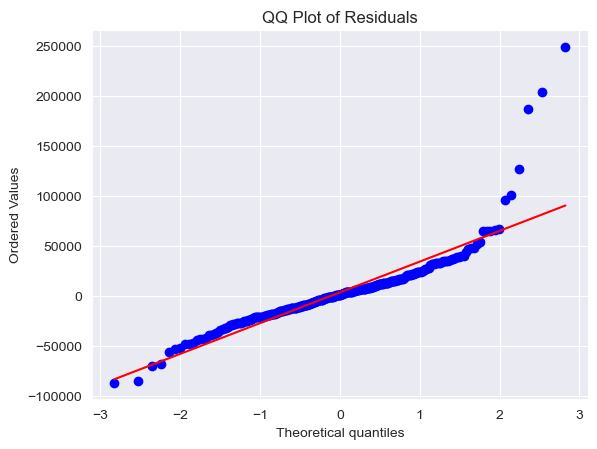

In [274]:
import scipy.stats as stats
#import matplotlib.pyplot as plt

# Calculate residuals
residuals = y_test - y_pred

# Create a QQ plot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("QQ Plot of Residuals")
plt.show()

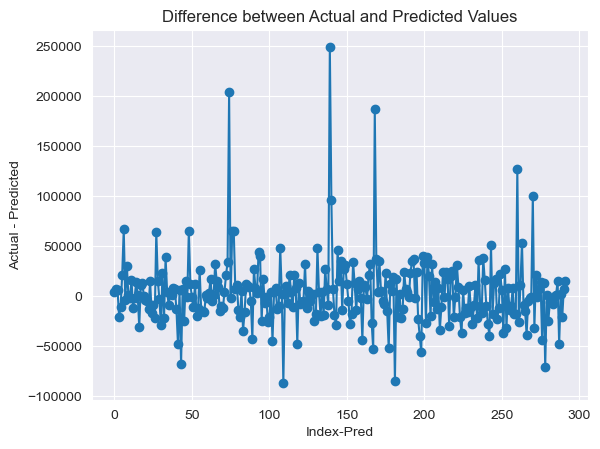

In [275]:
# Create a plot of the difference between actual and predicted values
plt.plot(range(len(y_test)), y_test - y_pred, marker='o', linestyle='-')
plt.xlabel("Index-Pred")
plt.ylabel("Actual - Predicted")
plt.title("Difference between Actual and Predicted Values")
plt.show()

## Decision Tree using mutual Info and SelectKBest

In [276]:
from sklearn.tree import DecisionTreeRegressor
DTR_mi = DecisionTreeRegressor()
DTR_mi.fit(x_train, y_train)
y_pred = DTR_mi.predict(x_test)

In [277]:
from sklearn import metrics
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
r2_dtr = r2_score(y_test, y_pred)
print("R-squared DTR:", r2_dtr) # for test data

MAE 27741.01712328767
MSE 1821066898.1541095
RMSE 42673.96042265247
R-squared DTR: 0.762582861671807


In [278]:
print('Coeff_of determination R^2 is: ',DTR_mi.score(x_train,y_train)) # R^2 is of train dataset

Coeff_of determination R^2 is:  0.9999950556906533


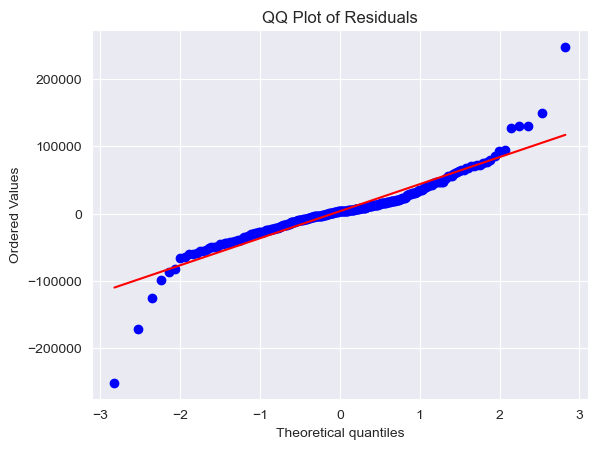

In [279]:
residuals = y_test - y_pred

# Create a QQ plot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("QQ Plot of Residuals")
plt.show()

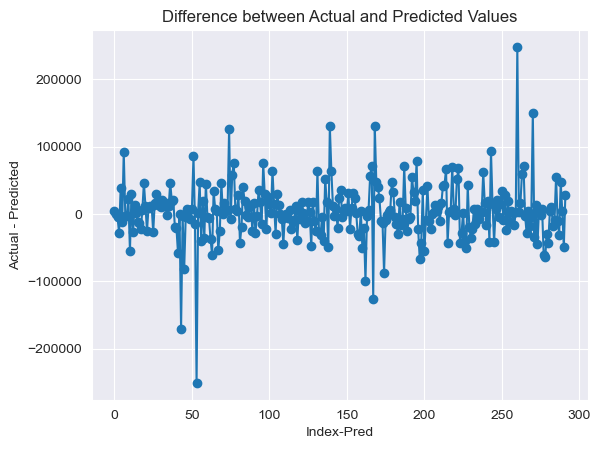

In [280]:
plt.plot(range(len(y_test)), y_test - y_pred, marker='o', linestyle='-')
plt.xlabel("Index-Pred")
plt.ylabel("Actual - Predicted")
plt.title("Difference between Actual and Predicted Values")
plt.show()

## Random Forest using Mutual Information gain

In [281]:
from sklearn.ensemble import RandomForestRegressor
RF_mi = RandomForestRegressor()
RF_mi.fit(x_train, y_train)

RandomForestRegressor()

In [282]:
y_pred = RF_mi.predict(x_test)

In [283]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print('Coeff_of determination R^2 is: ',RF_mi.score(x_train,y_train)) # R^2 is of train dataset

Coeff_of determination R^2 is:  0.9793371642615698


In [284]:
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("R-squared:", r2)

RMSE 27810.269427451803
Mean Absolute Error: 17208.16160795825
Mean Squared Error: 773411085.6274605
R-squared: 0.8991684232539197


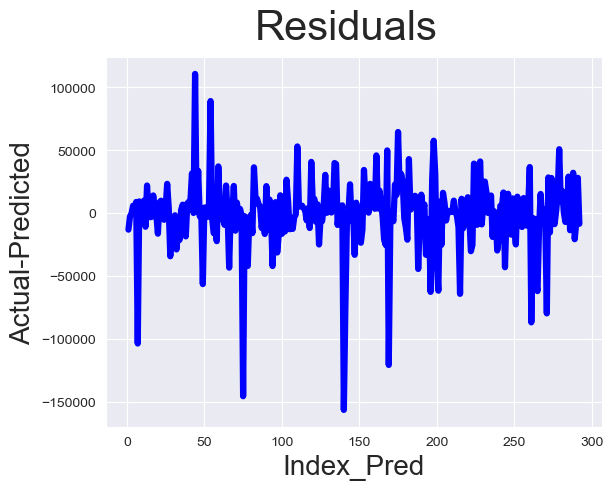

In [285]:
cnt = [i for i in range(1, len(y_pred) + 1)]

fig = plt.figure()
plt.plot(cnt, y_pred - y_test, color='blue', linewidth=4.5, linestyle='-')
fig.suptitle('Residuals', fontsize=30)
plt.xlabel('Index_Pred', fontsize=20)
plt.ylabel('Actual-Predicted', fontsize=20)
plt.show()

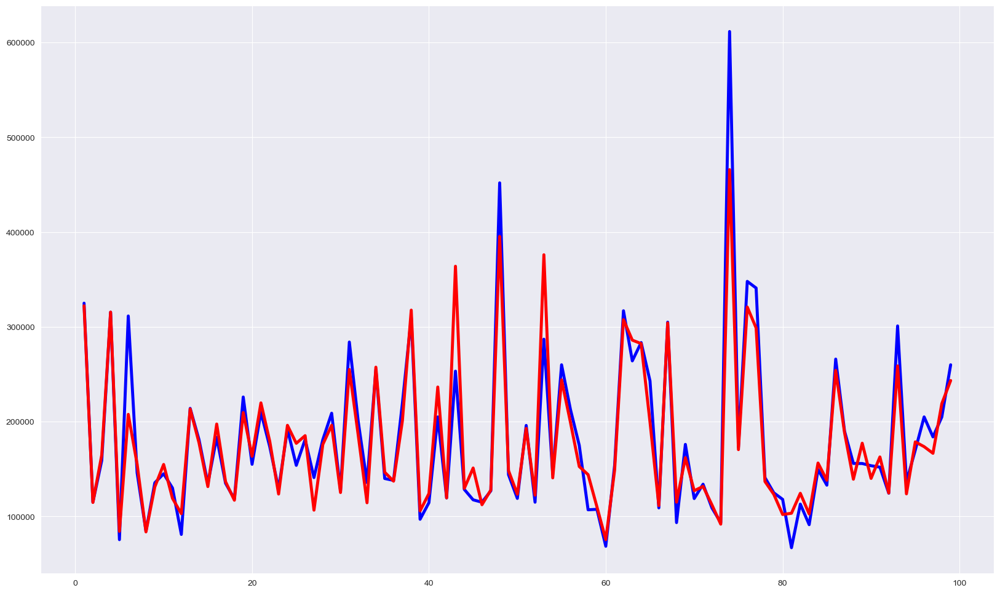

In [286]:
cnt=[i for i in range(1,100,1)]
plt.figure(figsize=(20, 12))
plt.plot(cnt,y_test[1:100],color="blue", linewidth=3.5,linestyle="-")  #Actual
plt.plot(cnt,y_pred[1:100],color="red", linewidth=3.5,linestyle="-")   #predicted
plt.show()

Based on these metrics:

Random Forest Regression has the highest Coefficient of Determination (R^2) of approximately 1. This indicates that it explains almost all of the variance in the data, which is a very strong performance.
Random Forest Regression also has the lowest RMSE (Root Mean Squared Error) and MAE (Mean Absolute Error), indicating the smallest errors in prediction.
Linear Regression and Decision Tree Regression have lower R-squared values and higher errors compared to Random Forest Regression.
Considering these metrics, Random Forest Regression is the best-performing model among the three options. It has nearly perfect R^2, lower errors, and higher predictive performance. Therefore, you should choose Random Forest Regression as the best model for your dataset.

In [288]:
test1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,2,80.0,11622,1,3,3,0,4,...,0,0,0,120,0,0,6,2010,8,4
1,1462,20,3,81.0,14267,1,0,3,0,0,...,36,0,0,0,0,12500,6,2010,8,4
2,1463,60,3,74.0,13830,1,0,3,0,4,...,34,0,0,0,0,0,3,2010,8,4
3,1464,60,3,78.0,9978,1,0,3,0,4,...,36,0,0,0,0,0,6,2010,8,4
4,1465,120,3,43.0,5005,1,0,1,0,4,...,82,0,0,144,0,0,1,2010,8,4


In [290]:
columns = x_train.columns
columns

Index(['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'LotShape',
       'Neighborhood', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt',
       'YearRemodAdd', 'Exterior1st', 'Exterior2nd', 'MasVnrArea', 'ExterQual',
       'Foundation', 'BsmtQual', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtUnfSF',
       'TotalBsmtSF', 'HeatingQC', 'CentralAir', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'FullBath', 'HalfBath', 'KitchenQual', 'TotRmsAbvGrd',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'SaleCondition'],
      dtype='object')

In [291]:
test_mi =test1[columns]
test_mi.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,LotShape,Neighborhood,HouseStyle,OverallQual,OverallCond,YearBuilt,...,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,SaleCondition
0,20,2,80.0,11622,3,12,2,5,6,1961,...,0,2,1,1961.0,2,1.0,730.0,140,0,4
1,20,3,81.0,14267,0,12,2,6,6,1958,...,0,2,1,1958.0,2,1.0,312.0,393,36,4
2,60,3,74.0,13830,0,8,4,5,5,1997,...,1,4,1,1997.0,0,2.0,482.0,212,34,4
3,60,3,78.0,9978,0,8,4,6,6,1998,...,1,2,1,1998.0,0,2.0,470.0,360,36,4
4,120,3,43.0,5005,0,22,2,8,5,1992,...,0,2,1,1992.0,1,2.0,506.0,0,82,4


In [293]:
pred_test= RF_mi.predict(test_mi)
submit_RF_mi = pd.DataFrame({
    'Id' :test1['Id'],
    'SalePrice' : pred_test
})

In [295]:
submit_RF_mi.head()

,Id,SalePrice
0,1461,125414.00
1,1462,159793.50
2,1463,178410.87
3,1464,185260.13
4,1465,200514.12


In [296]:
submit_RF_mi.to_csv('house_P_RF_mi.csv', index=False)

## Using ExtraTreesRegressor for Feature Selection

In [297]:
train1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,3,65.0,8450,1,3,3,0,4,...,0,0,0,0,0,2,2008,8,4,208500
1,2,20,3,80.0,9600,1,3,3,0,2,...,0,0,0,0,0,5,2007,8,4,181500
2,3,60,3,68.0,11250,1,0,3,0,4,...,0,0,0,0,0,9,2008,8,4,223500
3,4,70,3,60.0,9550,1,0,3,0,0,...,272,0,0,0,0,2,2006,8,0,140000
4,5,60,3,84.0,14260,1,0,3,0,2,...,0,0,0,0,0,12,2008,8,4,250000


In [298]:
x_train, x_test,y_train, y_test =train_test_split(train1.drop('SalePrice',axis=1),train1['SalePrice'],random_state=42,test_size=0.25)

In [299]:
x_train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1023,1024,120,3,43.0,3182,1,3,3,0,4,...,20,0,0,0,0,0,5,2008,8,4
810,811,20,3,78.0,10140,1,3,3,0,4,...,0,0,0,0,648,0,1,2006,8,4
1384,1385,50,3,60.0,9060,1,3,3,0,4,...,0,0,0,0,0,0,10,2009,8,4
626,627,20,3,69.0,12342,1,0,3,0,4,...,0,36,0,0,0,600,8,2007,8,4
813,814,20,3,75.0,9750,1,3,3,0,4,...,0,275,0,0,0,500,4,2007,0,4


In [300]:
from sklearn.ensemble import ExtraTreesRegressor

In [301]:
ex_regressor = ExtraTreesRegressor()

In [302]:
ex_regressor.fit(x_train,y_train)

ExtraTreesRegressor()

In [303]:
ex_regressor.feature_importances_

array([2.46519309e-03, 3.49844796e-03, 3.37489579e-03, 4.84865914e-03,
       9.93313625e-03, 1.68393594e-05, 2.57379676e-03, 4.37628085e-03,
       0.00000000e+00, 1.92865757e-03, 4.64439422e-03, 6.49980969e-03,
       1.26897571e-03, 2.11307382e-04, 2.25779241e-03, 1.90190568e-03,
       2.46116682e-01, 4.29293221e-03, 2.36744667e-02, 8.54665834e-03,
       1.80053109e-03, 5.80067310e-04, 2.49590774e-03, 2.49487104e-03,
       1.54432409e-03, 4.80358856e-03, 7.67593871e-02, 3.85657645e-03,
       1.61069321e-03, 7.26851662e-02, 1.00834141e-03, 3.94347718e-03,
       2.61313311e-03, 1.46462344e-02, 1.14724702e-03, 1.75045175e-03,
       2.62268970e-03, 1.24348871e-02, 6.05842148e-04, 1.60648834e-03,
       6.64211680e-03, 4.06171497e-04, 1.38339160e-02, 1.46662786e-02,
       6.87444919e-04, 8.01495449e-02, 6.52582435e-03, 4.87887936e-04,
       2.40823075e-02, 3.93820919e-03, 6.34037843e-03, 2.13002662e-03,
       1.48462288e-02, 8.38345596e-03, 1.62917119e-03, 1.98338244e-02,
      

In [304]:
ser = pd.Series(ex_regressor.feature_importances_,index=x_train.columns)

In [305]:
ser

Id               0.002465
MSSubClass       0.003498
MSZoning         0.003375
LotFrontage      0.004849
LotArea          0.009933
                   ...   
MiscVal          0.000282
MoSold           0.002510
YrSold           0.002237
SaleType         0.002628
SaleCondition    0.008433
Length: 76, dtype: float64

In [306]:
top_40_columns = ser.nlargest(40).index
top_40_columns

Index(['OverallQual', 'GarageCars', 'GrLivArea', 'ExterQual', 'BsmtQual',
       'GarageFinish', 'FullBath', 'YearBuilt', 'Fireplaces', 'KitchenQual',
       '2ndFlrSF', 'BsmtFinSF1', 'GarageArea', '1stFlrSF', 'TotalBsmtSF',
       'LotArea', 'YearRemodAdd', 'SaleCondition', 'TotRmsAbvGrd',
       'CentralAir', 'BsmtFullBath', 'Neighborhood', 'BedroomAbvGr',
       'PoolArea', 'GarageType', 'ScreenPorch', 'LotFrontage', 'MasVnrArea',
       'LandSlope', 'LandContour', 'OverallCond', 'BsmtExposure', 'HalfBath',
       'ExterCond', 'WoodDeckSF', 'OpenPorchSF', 'MSSubClass', 'MSZoning',
       'FireplaceQu', 'GarageYrBlt'],
      dtype='object')

In [307]:
# Lets choose 30 columns
top_30_columns = ser.nlargest(30).index
top_30_columns

Index(['OverallQual', 'GarageCars', 'GrLivArea', 'ExterQual', 'BsmtQual',
       'GarageFinish', 'FullBath', 'YearBuilt', 'Fireplaces', 'KitchenQual',
       '2ndFlrSF', 'BsmtFinSF1', 'GarageArea', '1stFlrSF', 'TotalBsmtSF',
       'LotArea', 'YearRemodAdd', 'SaleCondition', 'TotRmsAbvGrd',
       'CentralAir', 'BsmtFullBath', 'Neighborhood', 'BedroomAbvGr',
       'PoolArea', 'GarageType', 'ScreenPorch', 'LotFrontage', 'MasVnrArea',
       'LandSlope', 'LandContour'],
      dtype='object')

<Axes: title={'center': 'Feature Importance '}>

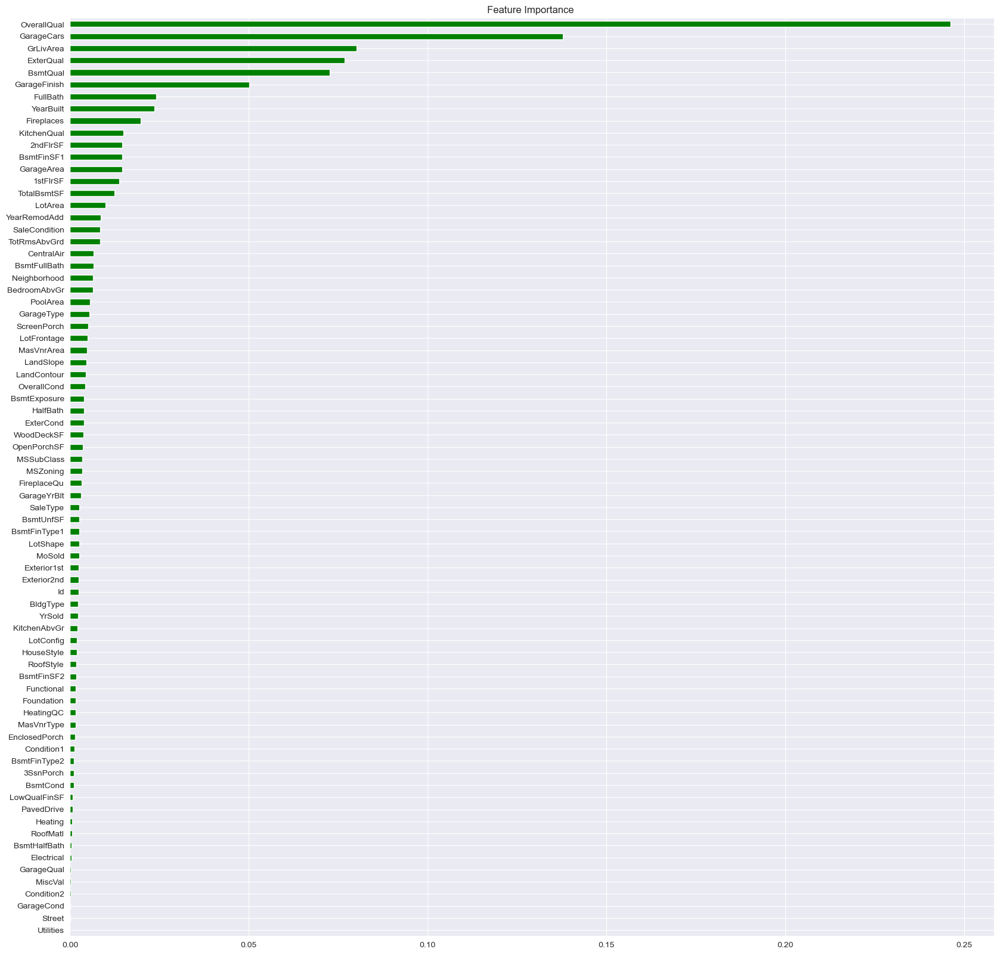

In [308]:
plt.figure(figsize=(20,20))
ser.sort_values(ascending=True).plot(kind='barh',color='green',grid=True,title="Feature Importance ")

In [309]:
trainET = pd.concat([train1[top_30_columns], train1['SalePrice']], axis=1)
trainET.head()

,OverallQual,GarageCars,GrLivArea,ExterQual,BsmtQual,GarageFinish,FullBath,YearBuilt,Fireplaces,KitchenQual,...,Neighborhood,BedroomAbvGr,PoolArea,GarageType,ScreenPorch,LotFrontage,MasVnrArea,LandSlope,LandContour,SalePrice
0,7,2,1710,2,2,1,2,2003,0,2,...,5,3,0,1,0,65.0,196.0,0,3,208500
1,6,2,1262,3,2,1,2,1976,1,3,...,24,3,0,1,0,80.0,0.0,0,3,181500
2,7,2,1786,2,2,1,2,2001,1,2,...,5,3,0,1,0,68.0,162.0,0,3,223500
3,7,3,1717,3,3,2,1,1915,1,2,...,6,3,0,5,0,60.0,0.0,0,3,140000
4,8,3,2198,2,2,1,2,2000,1,2,...,15,4,0,1,0,84.0,350.0,0,3,250000


In [310]:
x_train, x_test,y_train, y_test =train_test_split(trainET.drop('SalePrice',axis=1),trainET['SalePrice'],random_state=42,test_size=0.25)

In [311]:
from sklearn.linear_model import LinearRegression
lrm_ET = LinearRegression()
lrm_ET.fit(x_train, y_train)
print('Intercept is: ',lrm_ET.intercept_)
print('Coeff_of determination R^2 is: ',lrm_ET.score(x_train,y_train)) # R^2 is of train dataset
print("Coef for Variable are:\n",lrm_ET.coef_)

Intercept is:  -459531.60306523857
Coeff_of determination R^2 is:  0.8147703196869374
Coef for Variable are:
 [ 1.41312628e+04  1.14310569e+04  1.99296403e+01 -7.79238536e+03
 -9.86272924e+03 -4.30890155e+02 -1.83824581e+03  1.03560353e+02
  6.30639058e+03 -1.04171144e+04  1.51124640e+01  9.80826839e+00
  5.51249856e+00  2.23094313e+01  8.14909826e-01  3.95082841e-01
  1.36928637e+02  1.81769601e+03  2.41672247e+03  1.14645958e+04
  7.55958770e+03  3.71282949e+02  4.47845863e+02 -1.63597286e+01
 -1.18724486e+03  5.95820052e+01 -6.09965856e+01  1.35504028e+01
  1.57439829e+04  4.12163266e+03]


In [312]:
y_pred = lrm_ET.predict(x_test)
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

MAE 21926.446293145884
MSE 1159265324.6476336
RMSE 34047.98561806019


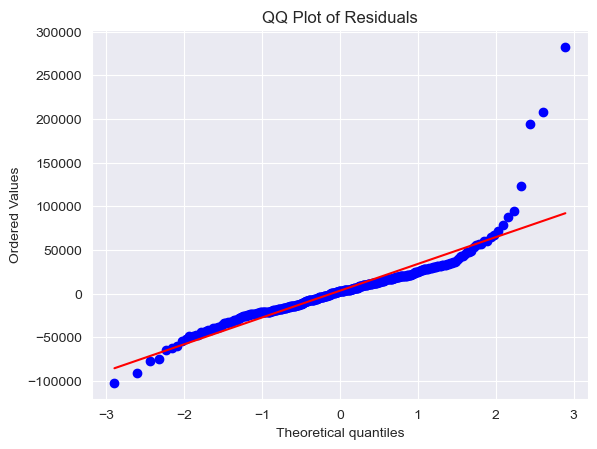

In [313]:
residuals = y_test - y_pred

# Create a QQ plot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("QQ Plot of Residuals")
plt.show()

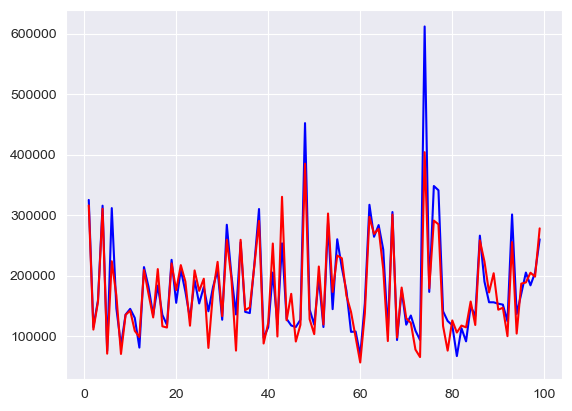

In [314]:
cnt=[i for i in range(1,100,1)]
# plt.figure(figsize=(20, 12))
plt.plot(cnt,y_test[1:100],color="blue", linewidth=1.5,linestyle="-")  #Actual
plt.plot(cnt,y_pred[1:100],color="red", linewidth=1.5,linestyle="-")   #predicted
plt.show()

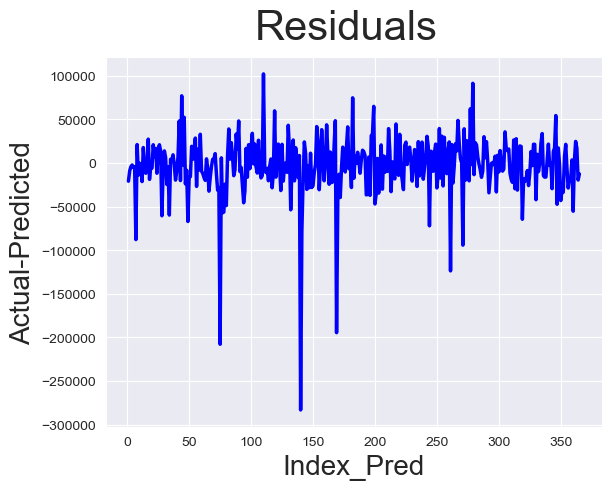

In [315]:
## Plotting the residuals
cnt = [i for i in range(1, len(y_pred) + 1)]
fig = plt.figure()
plt.plot(cnt, y_pred - y_test, color='blue', linewidth=2.5, linestyle='-')
fig.suptitle('Residuals', fontsize=30)
plt.xlabel('Index_Pred', fontsize=20)
plt.ylabel('Actual-Predicted', fontsize=20)
plt.show()

## Decision Tree

In [316]:
from sklearn.tree import DecisionTreeRegressor
DTR_ET = DecisionTreeRegressor()
DTR_ET.fit(x_train, y_train)
y_pred = DTR_ET.predict(x_test)

In [317]:
## Evaluation of model using MAE/MAPE (mean of absolute error which is the difference between actual and predicted values)
## MSE (mean value of squared error), RMSE (interprets error in terms of Y)

from sklearn import metrics
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
r2_dtr = r2_score(y_test, y_pred)
print("R-squared DTR:", r2_dtr)
print('Coeff_of determination R^2 is: ',DTR_ET.score(x_train,y_train)) # R^2 is of train dataset

MAE 24604.202739726028
MSE 1471823166.7123287
RMSE 38364.34759920112
R-squared DTR: 0.7898988958637256
Coeff_of determination R^2 is:  0.9999948189236124


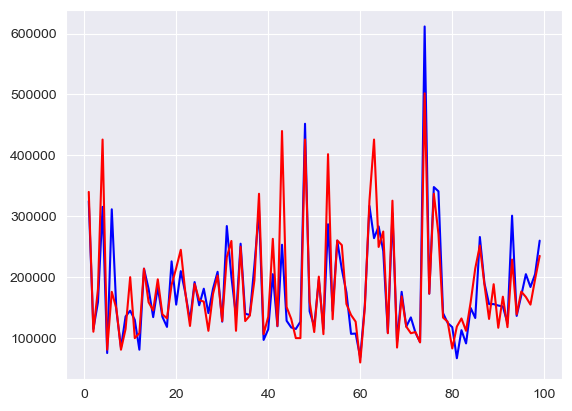

In [318]:
# let us plot actual and predicted.. Since there are many values let us look at 100 values

cnt=[i for i in range(1,100,1)]
# plt.figure(figsize=(20, 12))
plt.plot(cnt,y_test[1:100],color="blue", linewidth=1.5,linestyle="-")  #Actual
plt.plot(cnt,y_pred[1:100],color="red", linewidth=1.5,linestyle="-")   #predicted
plt.show()

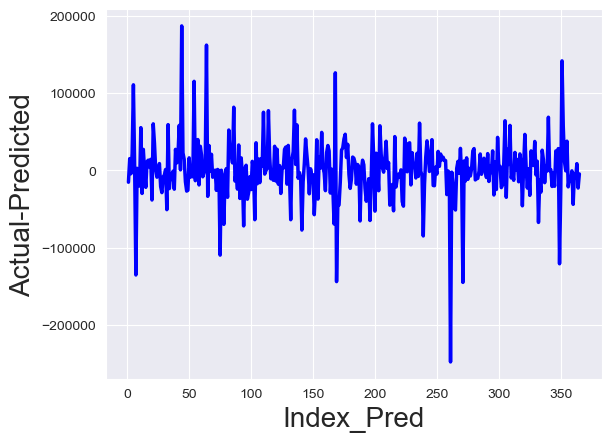

In [319]:
cnt = [i for i in range(1, len(y_pred) + 1)]
# fig=plt.figure()
plt.plot(cnt,y_pred-y_test, color = 'blue', linewidth = 2.5, linestyle = '-')
fig.suptitle('Residuals',fontsize = 30)
plt.xlabel('Index_Pred', fontsize = 20)
plt.ylabel('Actual-Predicted', fontsize = 20)
plt.show()

## Random Forest Regressor

In [320]:
RF_ET = RandomForestRegressor()
RF_ET.fit(x_train, y_train)
y_pred = RF_ET.predict(x_test)

In [321]:
## Evaluation of model using MAE/MAPE (mean of absolute error which is the difference between actual and predicted values)
## MSE (mean value of squared error), RMSE (interprets error in terms of Y)

from sklearn import metrics
print('MAE',metrics.mean_absolute_error(y_test, y_pred))
print('MSE',metrics.mean_squared_error(y_test, y_pred))
print('RMSE',np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
r2_RF = r2_score(y_test, y_pred)
print("R-squared RF:", r2_RF)
print('Coeff_of determination R^2 is: ',RF_ET.score(x_train,y_train)) # R^2 is of train dataset

MAE 16924.549242009132
MSE 733017022.1753483
RMSE 27074.287103732728
R-squared RF: 0.8953626432897249
Coeff_of determination R^2 is:  0.9784782325577377


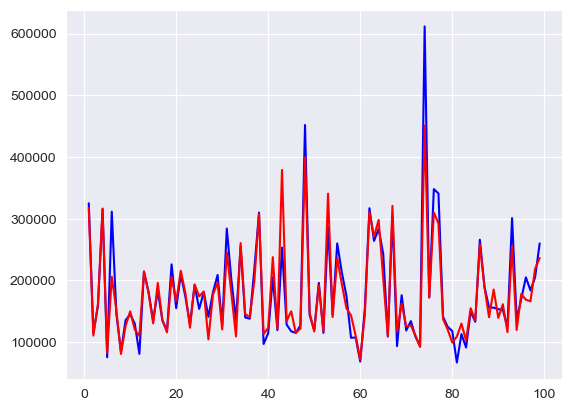

In [322]:
# let us plot actual and predicted.. Since there are many values let us look at 100 values

cnt=[i for i in range(1,100,1)]
# plt.figure(figsize=(20, 12))
plt.plot(cnt,y_test[1:100],color="blue", linewidth=1.5,linestyle="-")  #Actual
plt.plot(cnt,y_pred[1:100],color="red", linewidth=1.5,linestyle="-")   #predicted
plt.show()

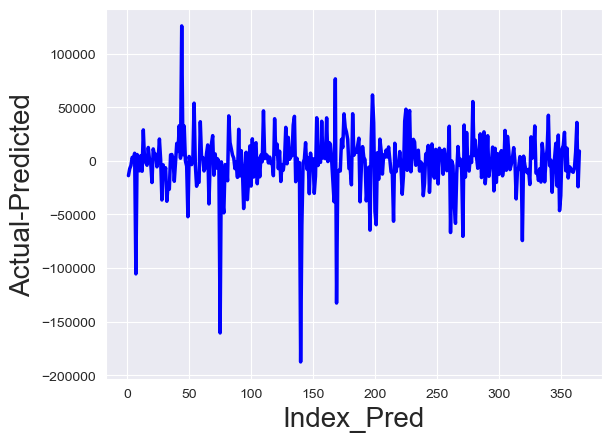

In [323]:
cnt = [i for i in range(1, len(y_pred) + 1)]
# fig=plt.figure()
plt.plot(cnt,y_pred-y_test, color = 'blue', linewidth = 2.5, linestyle = '-')
fig.suptitle('Residuals',fontsize = 30)
plt.xlabel('Index_Pred', fontsize = 20)
plt.ylabel('Actual-Predicted', fontsize = 20)
plt.show()

The Random Forest Regression model has the highest R^2 value (0.8954), indicating the best overall goodness of fit to the data.
It also has the lowest MAE and RMSE, which means it has the smallest average prediction errors and better predictive performance.
Therefore, the Random Forest Regression model is the best choice among the three models for your dataset.

In [325]:
test1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,2,80.0,11622,1,3,3,0,4,...,0,0,0,120,0,0,6,2010,8,4
1,1462,20,3,81.0,14267,1,0,3,0,0,...,36,0,0,0,0,12500,6,2010,8,4
2,1463,60,3,74.0,13830,1,0,3,0,4,...,34,0,0,0,0,0,3,2010,8,4
3,1464,60,3,78.0,9978,1,0,3,0,4,...,36,0,0,0,0,0,6,2010,8,4
4,1465,120,3,43.0,5005,1,0,1,0,4,...,82,0,0,144,0,0,1,2010,8,4


In [326]:
columns = x_train.columns
columns

Index(['OverallQual', 'GarageCars', 'GrLivArea', 'ExterQual', 'BsmtQual',
       'GarageFinish', 'FullBath', 'YearBuilt', 'Fireplaces', 'KitchenQual',
       '2ndFlrSF', 'BsmtFinSF1', 'GarageArea', '1stFlrSF', 'TotalBsmtSF',
       'LotArea', 'YearRemodAdd', 'SaleCondition', 'TotRmsAbvGrd',
       'CentralAir', 'BsmtFullBath', 'Neighborhood', 'BedroomAbvGr',
       'PoolArea', 'GarageType', 'ScreenPorch', 'LotFrontage', 'MasVnrArea',
       'LandSlope', 'LandContour'],
      dtype='object')

In [327]:
test_ET =test1[columns]
test_ET.head()

,OverallQual,GarageCars,GrLivArea,ExterQual,BsmtQual,GarageFinish,FullBath,YearBuilt,Fireplaces,KitchenQual,...,BsmtFullBath,Neighborhood,BedroomAbvGr,PoolArea,GarageType,ScreenPorch,LotFrontage,MasVnrArea,LandSlope,LandContour
0,5,1.0,896,3,3,2,1,1961,0,3,...,0.0,12,2,0,1,120,80.0,0.0,0,3
1,6,1.0,1329,3,3,2,1,1958,0,2,...,0.0,12,3,0,1,0,81.0,108.0,0,3
2,5,2.0,1629,3,2,0,2,1997,1,3,...,0.0,8,3,0,1,0,74.0,0.0,0,3
3,6,2.0,1604,3,3,0,2,1998,1,2,...,0.0,8,3,0,1,0,78.0,20.0,0,3
4,8,2.0,1280,2,2,1,2,1992,0,2,...,0.0,22,2,0,1,144,43.0,0.0,0,1


In [329]:
pred_test= RF_ET.predict(test_ET)
submit_RF_ET = pd.DataFrame({
    'id' :test1['Id'],
    'SalePrice' : pred_test
})
submit_RF_ET.head()

,id,SalePrice
0,1461,128722.83
1,1462,152194.50
2,1463,185346.34
3,1464,183542.25
4,1465,206871.08


In [330]:
submit_RF_ET.to_csv('house_P_RF_ET.csv', index=False)

## Hyper Parameter Optimisation

In [331]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor

In [332]:
n_estimators = [int(x) for x in np.linspace(200,2000,10)]
max_features =['auto','sqrt','log2']
max_depth = [int(x) for x in np.linspace(10,1000,10)]
min_samples_leaf=[1,2,4,6,8]
min_samples_split=[2,5,10,14]

random_grid = {'n_estimators'    :n_estimators,
              'max_features'     :max_features,
              'max_depth'        :max_depth,
              'min_samples_leaf' : min_samples_leaf,
              'min_samples_split': min_samples_split,
              'criterion' : ["squared_error", "absolute_error", "poisson"]}
print(random_grid)

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [10, 120, 230, 340, 450, 560, 670, 780, 890, 1000], 'min_samples_leaf': [1, 2, 4, 6, 8], 'min_samples_split': [2, 5, 10, 14], 'criterion': ['squared_error', 'absolute_error', 'poisson']}


In [333]:
RF_best=RandomizedSearchCV(estimator=RandomForestRegressor(),param_distributions=random_grid,n_iter=10,n_jobs=-1,cv=3,verbose=12,random_state=42)

In [334]:
RF_best.fit(x_train,y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'criterion': ['squared_error',
                                                      'absolute_error',
                                                      'poisson'],
                                        'max_depth': [10, 120, 230, 340, 450,
                                                      560, 670, 780, 890,
                                                      1000],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 5, 10, 14],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, verbose=12)

In [335]:
RF_best.best_estimator_

RandomForestRegressor(criterion='poisson', max_depth=890, max_features='auto',
                      min_samples_leaf=2, min_samples_split=5,
                      n_estimators=200)

In [336]:
RF_random=RF_best.best_estimator_

In [337]:
y_pred_random=RF_random.predict(x_test)

In [338]:
RF_random.score(x_train,y_train)

0.9650903614940494

In [339]:
from sklearn.metrics import mean_squared_error,mean_absolute_percentage_error,r2_score

In [340]:
print('Mean Squared error             : {} ' .format(mean_squared_error(y_test,y_pred_random)))
print('Mean absolute %  Squared error : {} ' .format(mean_absolute_percentage_error(y_test,y_pred_random)))
print('Root Mean Squared error        : {} ' .format(np.sqrt(mean_squared_error(y_test,y_pred_random))))
print('r2 score                       : {} ' .format(r2_score(y_test,y_pred_random)))

Mean Squared error             : 716633091.3751155 
Mean absolute %  Squared error : 0.10120047138465083 
Root Mean Squared error        : 26770.003574432252 
r2 score                       : 0.8977014310116973 


Text(0, 0.5, 'y_pred_random')

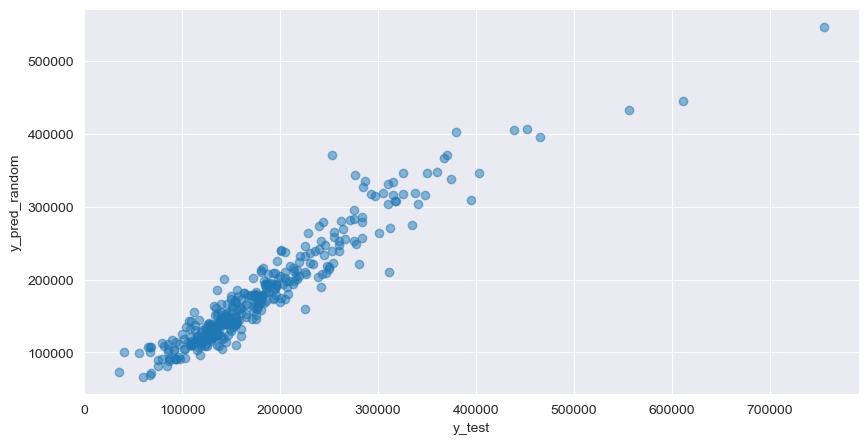

In [341]:
plt.figure(figsize=(10,5))
plt.scatter(x=y_test,y=y_pred_random,alpha=0.5)
plt.xlabel('y_test')
plt.ylabel('y_pred_random')

In [342]:
test1.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,2,80.0,11622,1,3,3,0,4,...,0,0,0,120,0,0,6,2010,8,4
1,1462,20,3,81.0,14267,1,0,3,0,0,...,36,0,0,0,0,12500,6,2010,8,4
2,1463,60,3,74.0,13830,1,0,3,0,4,...,34,0,0,0,0,0,3,2010,8,4
3,1464,60,3,78.0,9978,1,0,3,0,4,...,36,0,0,0,0,0,6,2010,8,4
4,1465,120,3,43.0,5005,1,0,1,0,4,...,82,0,0,144,0,0,1,2010,8,4


In [343]:
columns = x_train.columns
columns

Index(['OverallQual', 'GarageCars', 'GrLivArea', 'ExterQual', 'BsmtQual',
       'GarageFinish', 'FullBath', 'YearBuilt', 'Fireplaces', 'KitchenQual',
       '2ndFlrSF', 'BsmtFinSF1', 'GarageArea', '1stFlrSF', 'TotalBsmtSF',
       'LotArea', 'YearRemodAdd', 'SaleCondition', 'TotRmsAbvGrd',
       'CentralAir', 'BsmtFullBath', 'Neighborhood', 'BedroomAbvGr',
       'PoolArea', 'GarageType', 'ScreenPorch', 'LotFrontage', 'MasVnrArea',
       'LandSlope', 'LandContour'],
      dtype='object')

In [344]:
test_RF_random =test1[columns]
test_RF_random.head()

,OverallQual,GarageCars,GrLivArea,ExterQual,BsmtQual,GarageFinish,FullBath,YearBuilt,Fireplaces,KitchenQual,...,BsmtFullBath,Neighborhood,BedroomAbvGr,PoolArea,GarageType,ScreenPorch,LotFrontage,MasVnrArea,LandSlope,LandContour
0,5,1.0,896,3,3,2,1,1961,0,3,...,0.0,12,2,0,1,120,80.0,0.0,0,3
1,6,1.0,1329,3,3,2,1,1958,0,2,...,0.0,12,3,0,1,0,81.0,108.0,0,3
2,5,2.0,1629,3,2,0,2,1997,1,3,...,0.0,8,3,0,1,0,74.0,0.0,0,3
3,6,2.0,1604,3,3,0,2,1998,1,2,...,0.0,8,3,0,1,0,78.0,20.0,0,3
4,8,2.0,1280,2,2,1,2,1992,0,2,...,0.0,22,2,0,1,144,43.0,0.0,0,1


In [345]:
pred_test= RF_random.predict(test_RF_random)
submit_RF_HyperParameterO = pd.DataFrame({
    'id' :test1['Id'],
    'SalePrice' : pred_test
})
submit_RF_HyperParameterO.head()

,id,SalePrice
0,1461,126020.438024
1,1462,152229.528710
2,1463,185008.818222
3,1464,184051.015944
4,1465,203934.921001


In [346]:
submit_RF_HyperParameterO.to_csv('house_P_RF_HyperParameterO.csv', index=False)